# Import thư viện cần thiết

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import re
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split


from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import time

In [ ]:
url = "https://drive.google.com/uc?export=download&id=1NRmhEjDY628FEtJVu_tJl7itSGBJZ3h1"
df = pd.read_csv(url)
df = df.drop(columns=["ID", "Customer_ID", "Type_of_Loan", "SSN", "Name"]) #Bỏ các cột không cần thiết

unique_counts = df.nunique(dropna=True)

# Hiển thị theo dạng bảng
print("📊 Số lượng giá trị unique của từng cột:")
print(unique_counts.sort_values(ascending=False))

# Nếu muốn xem cả các giá trị bị trống (NaN)
print("\n🔍 Số lượng giá trị bị thiếu (NaN) của từng cột:")
print(df.isna().sum())


📊 Số lượng giá trị unique của từng cột:
Credit_Utilization_Ratio    100000
Monthly_Balance              98792
Amount_invested_monthly      91049
Annual_Income                18940
Total_EMI_per_month          14950
Monthly_Inhand_Salary        13235
Outstanding_Debt             13178
Changed_Credit_Limit          4384
Age                           1788
Interest_Rate                 1750
Num_Credit_Inquiries          1223
Num_Credit_Card               1179
Num_Bank_Accounts              943
Num_of_Delayed_Payment         749
Num_of_Loan                    434
Credit_History_Age             404
Delay_from_due_date             73
Occupation                      16
Month                            8
Payment_Behaviour                7
Credit_Mix                       4
Payment_of_Min_Amount            3
Credit_Score                     3
dtype: int64

🔍 Số lượng giá trị bị thiếu (NaN) của từng cột:
Month                           0
Age                             0
Occupation               

# 1. Tổng quan về dữ liệu

In [ ]:
df.head(5)

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,February,23,Scientist,19114.12,NaN,3,4,3,4,-1,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,March,-500,Scientist,19114.12,NaN,3,4,3,4,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,April,23,Scientist,19114.12,NaN,3,4,3,4,5,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,May,23,Scientist,19114.12,1824.843333,3,4,3,4,6,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


# 2. Tiền xử lý dữ liệu

In [ ]:
df.isnull().sum()

Month                           0
Age                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

In [ ]:
df1 = df.copy()
numeric_cols = [
    'Age', 'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
    'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
    'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
    'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
    'Total_EMI_per_month', 'Amount_invested_monthly', 'Monthly_Balance', 'Credit_History_Age'
]

cat_cols = ['Month', 'Occupation', 'Payment_Behaviour',
            'Credit_Mix', 'Payment_of_Min_Amount']

## 2.1: Làm sạch dữ liệu

In [ ]:
# Chuyển về số năm
def convert_credit_history(val):
    if pd.isna(val):
        return np.nan
    val = str(val).lower().strip()

    # nếu toàn ký tự vô nghĩa hoặc trống
    if val in ['', 'nan', '_', 'none', 'na']:
        return np.nan

    # loại ký tự lạ
    val = re.sub(r'[^0-9a-z\s]', '', val)

    # tách số năm và số tháng
    year_match = re.search(r'(\d+)\s*year', val)
    month_match = re.search(r'(\d+)\s*month', val)

    years = int(year_match.group(1)) if year_match else 0
    months = int(month_match.group(1)) if month_match else 0

    # nếu cả năm và tháng đều không có, xem có phải chỉ là số đơn lẻ (vd: "3" hoặc "24")
    if not year_match and not month_match:
        num_match = re.search(r'\d+', val)
        if num_match:
            # nếu nhỏ hơn 15 => coi là năm, lớn hơn 15 => coi là tháng
            n = int(num_match.group(0))
            return round(n if n < 15 else n / 12, 2)
        else:
            return np.nan

    return round(years + months / 12, 2)


df1['Credit_History_Age'] = df1['Credit_History_Age'].apply(convert_credit_history)


In [ ]:
import re
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder

# ===== 3. Hàm làm sạch giá trị số =====
def clean_numeric(val):
    if pd.isna(val):  # giá trị NaN
        return np.nan
    val = str(val).strip()
    cleaned = re.sub(r'[^0-9.\-]', '', val)  # loại ký tự không hợp lệ
    if cleaned == '' or cleaned == '_' or cleaned == '.':
        return np.nan
    try:
        return abs(float(cleaned))  # ép về số dương
    except:
        return np.nan

# Áp dụng làm sạch cho từng cột số
for col in numeric_cols:
    df1[col] = df1[col].apply(clean_numeric)

# ===== 3.5. Loại bỏ hàng toàn NaN hoặc có quá nhiều NaN =====
df1.dropna(subset=numeric_cols, how='all', inplace=True)

# ===== 4. Với cột số → thay giá trị thiếu bằng trung bình =====
for col in numeric_cols:
    mean_val = df1[col].mean()
    df1[col] = df1[col].fillna(mean_val)

# ===== 5. Xử lý ngoại lai bằng phương pháp IQR =====
def remove_outliers_iqr(df, columns, factor=1.5, verbose=True):
    """
    Loại bỏ ngoại lai trong DataFrame dựa trên quy tắc IQR (Interquartile Range)
    """
    df_clean = df.copy()
    initial_shape = df_clean.shape

    for col in columns:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR

        # Giữ lại các hàng trong khoảng cho phép
        df_clean = df_clean[(df_clean[col] >= lower_bound) & (df_clean[col] <= upper_bound)]

    if verbose:
        removed = initial_shape[0] - df_clean.shape[0]
        print(f"Đã loại bỏ {removed} hàng ngoại lai ({removed/initial_shape[0]*100:.2f}%)")

    return df_clean

# Áp dụng cho các cột số
df1 = remove_outliers_iqr(df1, numeric_cols, factor=1.5)


Đã loại bỏ 46033 hàng ngoại lai (46.03%)


In [ ]:
# Xóa các hàng có giá trị NaN ở cột category
def clean_category(val):
    if pd.isna(val):
        return np.nan
    val = str(val).strip()
    # Loại bỏ các giá trị vô nghĩa như '____', 'nan', rỗng, v.v.
    if val == '' or re.fullmatch(r'_+', val) or val.lower() in ['nan', 'none', 'null']:
        return np.nan
    return val

for col in cat_cols:
    df1[col] = df1[col].apply(clean_category)

# Xóa các hàng có giá trị NaN ở cột category sau khi làm sạch
df1.dropna(subset=cat_cols, inplace=True)


# ===== 6. Mã hóa OneHot =====
encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')
encoded_array = encoder.fit_transform(df1[cat_cols])
encoded_cols = encoder.get_feature_names_out(cat_cols)

df_encoded = pd.DataFrame(encoded_array, columns=encoded_cols, index=df1.index)

# ===== 7. Ghép lại dữ liệu số + category =====
df_final = pd.concat([df1.drop(columns=cat_cols), df_encoded], axis=1)

# ===== 8. Kết quả =====
print("Kích thước sau làm sạch:", df_final.shape)
print(df_final.head())


Kích thước sau làm sạch: (39917, 49)
    Age  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
1  23.0       19114.12            4194.170850                3.0   
3  23.0       19114.12            4194.170850                3.0   
4  23.0       19114.12            1824.843333                3.0   
5  23.0       19114.12            4194.170850                3.0   
6  23.0       19114.12            1824.843333                3.0   

   Num_Credit_Card  Interest_Rate  Num_of_Loan  Delay_from_due_date  \
1              4.0            3.0          4.0                  1.0   
3              4.0            3.0          4.0                  5.0   
4              4.0            3.0          4.0                  6.0   
5              4.0            3.0          4.0                  8.0   
6              4.0            3.0          4.0                  3.0   

   Num_of_Delayed_Payment  Changed_Credit_Limit  ...  \
1               30.946268                 11.27  ...   
3              

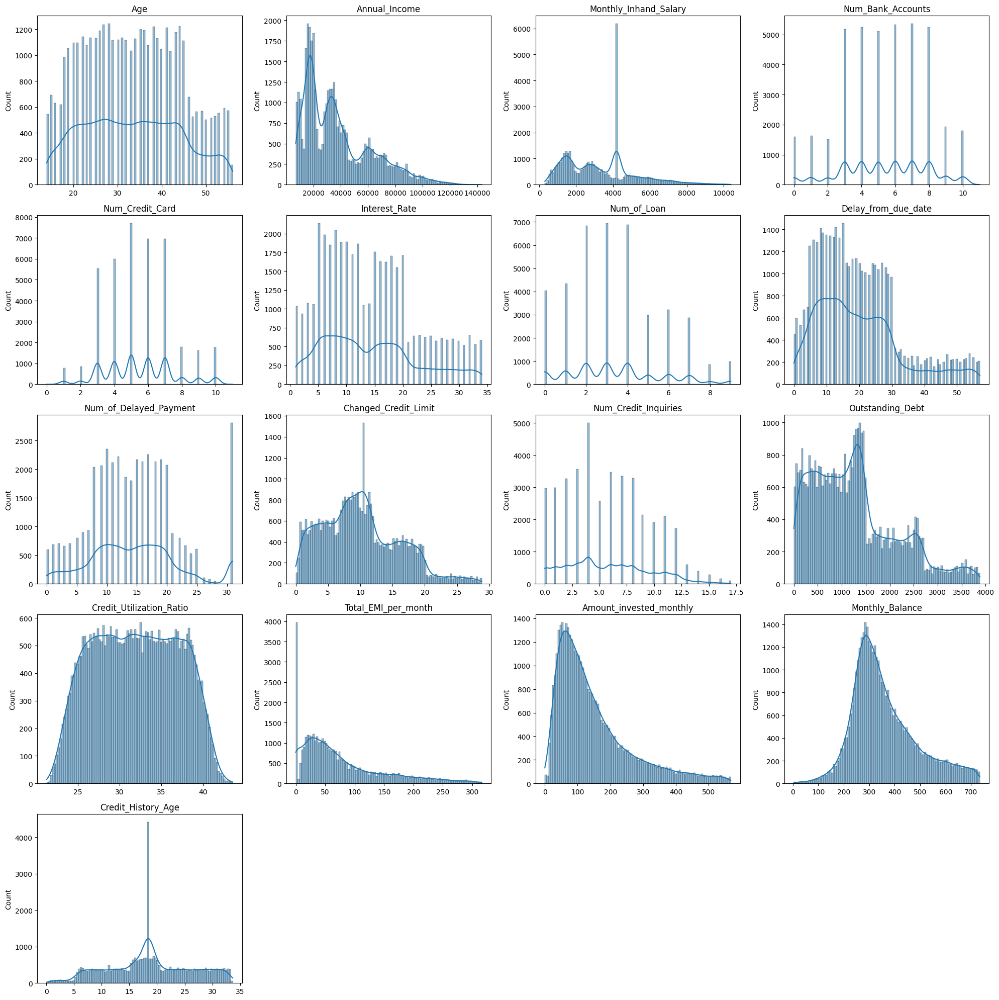

In [ ]:
def plot_histograms(df, columns, rows=2, cols=3):

    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
    axes = axes.flatten()

    for i, col in enumerate(columns):
        if i < len(axes):
            sns.histplot(df[col], kde=True, ax=axes[i], bins=100)
            axes[i].set_title(col)
            axes[i].set_xlabel('')

    # Remove unused subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

plot_histograms(df_final, numeric_cols, rows=5, cols=4)


In [ ]:
corr = df_final[numeric_cols].corr()

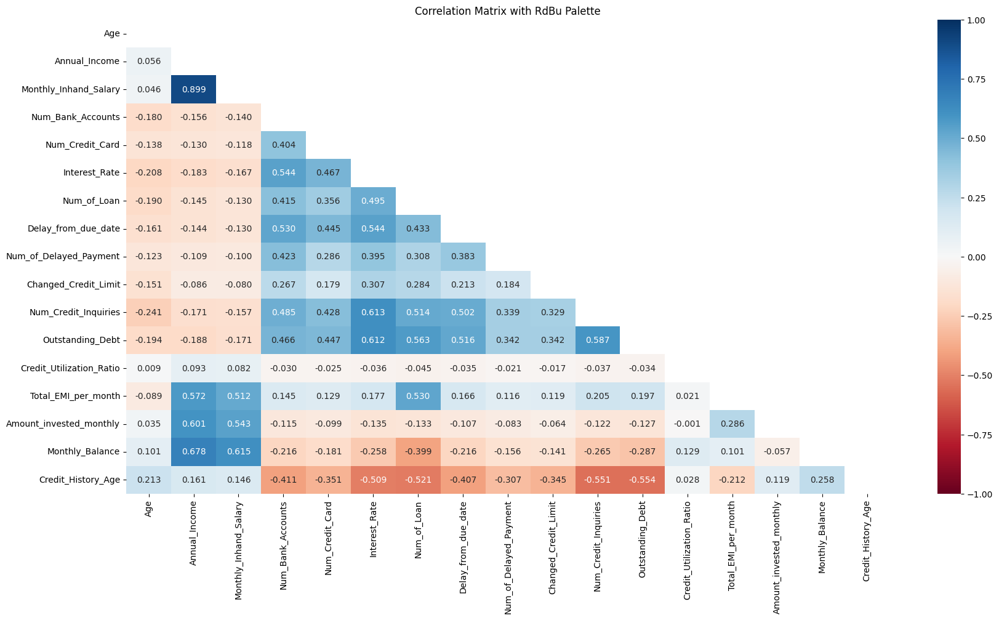

In [ ]:
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(20, 10))
sns.heatmap(
    corr,
    annot=True,
    mask=mask,
    fmt=".3f",
    annot_kws={"fontsize": 10},
    cmap="RdBu",
    vmin=-1,
    vmax=1
)
plt.title("Correlation Matrix with RdBu Palette")
plt.show()

### Trực quan các cột category

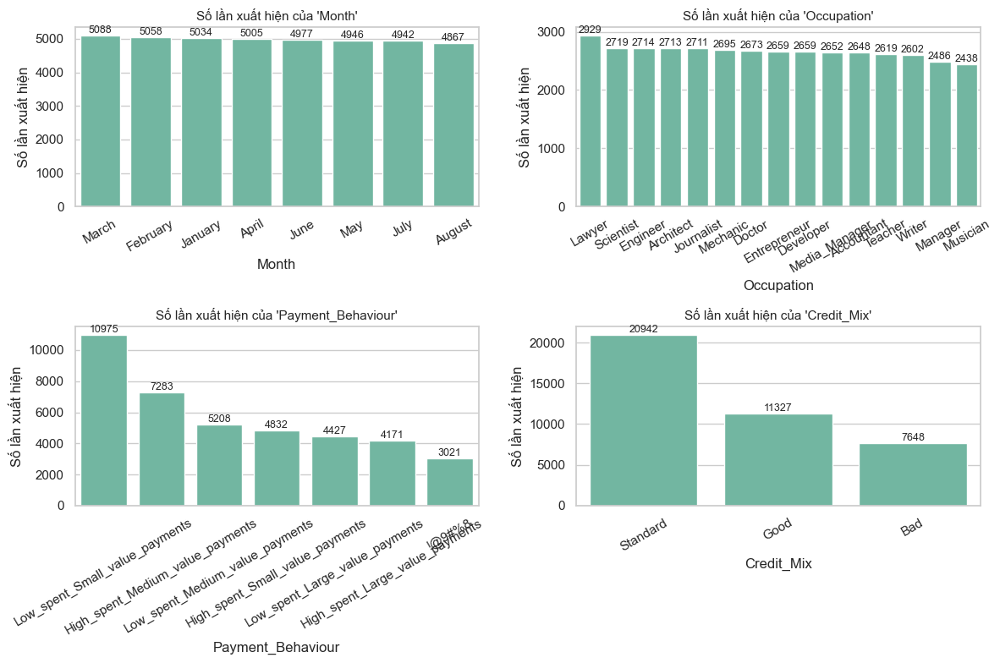

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Đặt style cho đẹp
sns.set_theme(style="whitegrid", palette="Set2")

# Giới hạn số cột hiển thị (nếu có nhiều hơn 4)
cols_to_plot = cat_cols[:4]  # lấy 4 cột đầu tiên, bạn có thể đổi nếu cần

# Tạo figure 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

# Vẽ từng biểu đồ vào từng ô
for i, col in enumerate(cols_to_plot):
    ax = axes[i]
    sns.countplot(data=df1, x=col, order=df1[col].value_counts().index, ax=ax)

    # Hiển thị số lượng trên đầu cột
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=9)

    ax.set_title(f"Số lần xuất hiện của '{col}'", fontsize=11)
    ax.set_xlabel(col)
    ax.set_ylabel("Số lần xuất hiện")
    ax.tick_params(axis='x', rotation=30)

# Nếu số cột < 4 thì ẩn ô trống
for j in range(i+1, 4):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# 2. Giảm chiều

In [ ]:
df_sample = df_final.sample(5000, random_state=42)
y = df_sample["Credit_Score"]
X = df_sample.drop(columns="Credit_Score")

## 2.1 PCA và LDA

In [ ]:

# 1️⃣ Chuẩn hoá dữ liệu
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# 2️⃣ PCA
pca = PCA(n_components=0.7)  # giữ lại 70% phương sai
X_pca = pca.fit_transform(X_std)

print("\n================ PCA ==================")
print(f"Số thành phần chính: {pca.n_components_}")
print("Tỷ lệ phương sai giải thích của từng thành phần:")
print(np.round(pca.explained_variance_ratio_, 4))
print("Tổng phương sai giữ lại:", round(sum(pca.explained_variance_ratio_), 4))
print("Ma trận thành phần chính (PCA components_):")
print(pd.DataFrame(pca.components_, columns=X.columns).round(3))

# 3️⃣ LDA
lda = LDA(n_components=2)
X_lda = lda.fit_transform(X_std, y)

print("\n================ LDA ==================")
print("Số thành phần phân biệt (LDA): 2")
print("Ma trận trọng số của các đặc trưng (LDA scalings_):")
print(pd.DataFrame(lda.scalings_, index=X.columns).round(3).head(10))

# explained_variance_ratio_ có thể không tồn tại trong một số phiên bản sklearn
evr = getattr(lda, "explained_variance_ratio_", None)
if evr is not None:
    print("Giá trị riêng (eigenvalues) LDA:")
    print(np.round(evr, 4))


# 4️⃣ Gộp dữ liệu đã giảm chiều để trực quan
data_pca = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
data_lda = pd.DataFrame(X_lda, columns=[f"LD{i+1}" for i in range(X_lda.shape[1])])
data_pca["y"] = y.values
data_lda["y"] = y.values



================ PCA ==================
Số thành phần chính: 22
Tỷ lệ phương sai giải thích của từng thành phần:
[0.1444 0.0639 0.039  0.0363 0.0264 0.0261 0.0255 0.0251 0.0249 0.0247
 0.024  0.0238 0.0236 0.0233 0.0231 0.0225 0.0224 0.0224 0.0223 0.0222
 0.022  0.0219]
Tổng phương sai giữ lại: 0.7099
Ma trận thành phần chính (PCA components_):
      Age  Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  \
0  -0.119         -0.124                 -0.118              0.268   
1  -0.030          0.520                  0.498              0.044   
2  -0.043         -0.046                 -0.046              0.028   
3  -0.035          0.099                  0.094             -0.031   
4  -0.127          0.018                  0.017             -0.014   
5  -0.027          0.040                  0.044              0.006   
6   0.031         -0.028                 -0.017             -0.028   
7   0.041          0.012                  0.001              0.035   
8  -0.084         -0.0

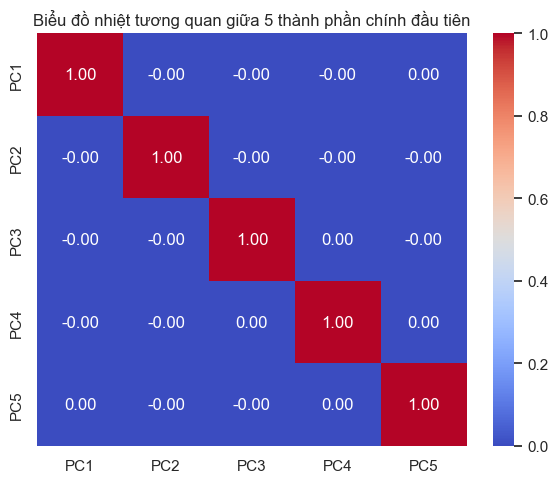

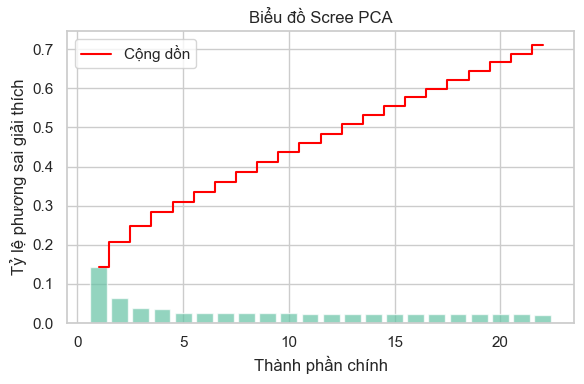

In [ ]:
# Tạo DataFrame chứa các thành phần chính
pca_df = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(X_pca.shape[1])])
pca_df["y"] = y.values  # thêm nhãn để vẽ màu

# ===== 1 Biểu đồ nhiệt tương quan của 5 thành phần chính đầu =====
plt.figure(figsize=(6,5))
corr = pca_df.iloc[:, :5].corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Biểu đồ nhiệt tương quan giữa 5 thành phần chính đầu tiên")
plt.tight_layout()
plt.show()

# ===== 2 Biểu đồ tỷ lệ phương sai giải thích (Scree plot) =====
explained_var = pca.explained_variance_ratio_

plt.figure(figsize=(6,4))
plt.bar(range(1, len(explained_var)+1), explained_var, alpha=0.7, align='center')
plt.step(range(1, len(explained_var)+1), np.cumsum(explained_var), where='mid', color='red', label='Cộng dồn')
plt.xlabel('Thành phần chính')
plt.ylabel('Tỷ lệ phương sai giải thích')
plt.title('Biểu đồ Scree PCA')
plt.legend()
plt.tight_layout()
plt.show()


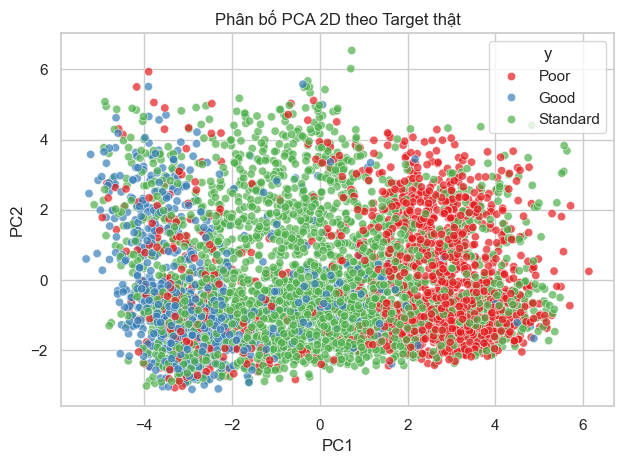

In [ ]:
# Use the dataframe and the correct column name for the hue (avoid reserved keyword 'class')
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='y', palette="Set1", alpha=0.7)
plt.title("Phân bố PCA 2D theo Target thật")
plt.tight_layout()
plt.show()


#### Giảm chiềU PCA không đem lại mấy lợi ích vì không có thành phần nào thực sự đáng kể trong việc mô tả bộ dữ liệu. Dữ liệu phân tán khá đều trên nhiều chiều. PC1 chứa nhiều thông tin nhất các PC còn lại chủ yếu là nhiễu.

## 2.2 Trực quan kết quả LDA

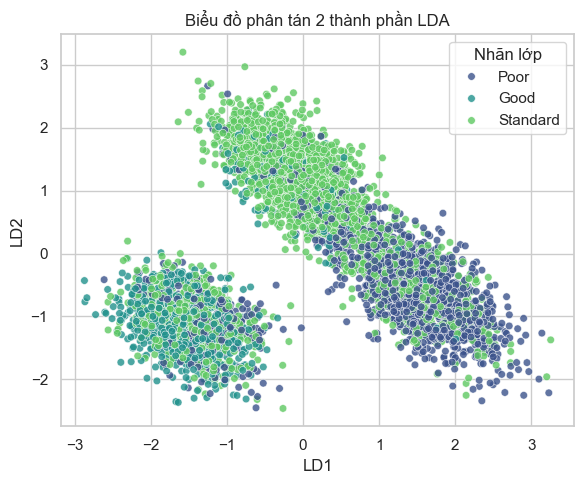

In [ ]:
lda_df = pd.DataFrame(X_lda, columns=['LD1', 'LD2'])
lda_df["y"] = y.values

plt.figure(figsize=(6,5))
sns.scatterplot(data=lda_df, x='LD1', y='LD2', hue='y', palette='viridis', s=30, alpha=0.8)
plt.title("Biểu đồ phân tán 2 thành phần LDA")
plt.xlabel("LD1")
plt.ylabel("LD2")
plt.legend(title="Nhãn lớp")
plt.tight_layout()
plt.show()


<Axes: xlabel='LD1', ylabel='Count'>

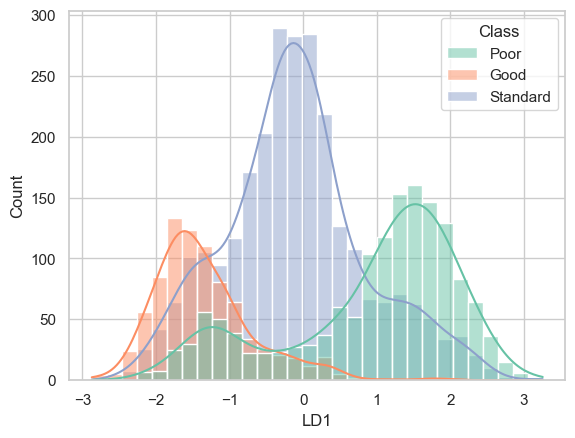

In [ ]:
df_plot = pd.DataFrame({
    'LD1': X_lda[:, 0],
    'Class': y
})

sns.histplot(data=df_plot, x='LD1', hue='Class', kde=True, bins=30)

#### LDA đã thành công trong việc tách nhóm “Poor” ra khỏi phần còn lại — dấu hiệu cho thấy có đặc trưng mạnh giúp nhận diện nhóm rủi ro cao. Tuy nhiên, “Standard” và “Good” vẫn còn chồng lấn, nghĩa là hai nhóm này không quá khác biệt tuyến tính. Vậy nên giảm chiều bằng LDA cũng không đem lại quá nhiều lợi ích.

# 3 Phân cụm

In [ ]:
from __future__ import print_function
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
np.random.seed(11)

CHUYỂN ĐỔI NHÃN SANG SỐ

In [ ]:
y_true = np.array(y.map({'Good': 2, 'Poor': 0, 'Standard' : 1}))
y_true

array([0, 2, 1, ..., 1, 2, 0], shape=(5000,))

In [ ]:

pca_2d = PCA(n_components=2)
X_2d = pca_2d.fit_transform(X_std)

In [ ]:
def plot_true_class_distribution(X_2d, y_true):
    X_poor = X_2d[y_true == 0]
    X_standard = X_2d[y_true == 1]
    X_good = X_2d[y_true == 2]

    plt.figure(figsize=(7, 6))

    plt.scatter(
        X_poor[:, 0], X_poor[:, 1],
        c='blue', marker='^', s=15, alpha=0.8,
        label='Poor'
    )

    plt.scatter(
        X_standard[:, 0], X_standard[:, 1],
        c='green', marker='o', s=15, alpha=0.8,
        label='Standard'
    )

    plt.scatter(
        X_good[:, 0], X_good[:, 1],
        c='red', marker='s', s=15, alpha=0.8,
        label='Good'
    )

    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title('True Class Distribution (PCA 2D)')
    plt.legend()
    plt.axis('equal')
    plt.show()


## 3.1 K-Means

Hàm hỗ trợ

In [ ]:
def kmeans_init_centers(X, K):
  n_samples, n_features = X.shape
  centers = np.empty((K, n_features))

  # 1. Chọn tâm đầu tiên ngẫu nhiên
  idx = np.random.randint(n_samples)
  centers[0] = X[idx]

  # 2. Chọn các tâm tiếp theo
  for k in range(1, K):
      # Tính khoảng cách bình phương tới tâm gần nhất
      dist_sq = np.min(cdist(X, centers[:k])**2, axis=1)

      # Xác suất chọn tâm
      prob = dist_sq / np.sum(dist_sq)

      # Chọn tâm mới theo phân phối xác suất
      idx = np.random.choice(n_samples, p=prob)
      centers[k] = X[idx]

  return centers
  # randomly pick k rows of X as initial centers
  #return X[np.random.choice(X.shape[0], k, replace=False)]

def kmeans_assign_labels(X, centers):
    # calculate pairwise distances btw data and centers
    D = cdist(X, centers)
    # return index of the closest center
    return np.argmin(D, axis = 1)

def kmeans_update_centers(X, labels, K):
    centers = np.zeros((K, X.shape[1]))
    for k in range(K):
        # collect all points assigned to the k-th cluster
        Xk = X[labels == k, :]
        # take average
        centers[k,:] = np.mean(Xk, axis = 0)
    return centers

def has_converged(centers, new_centers):
    # return True if two sets of centers are the same
    return (set([tuple(a) for a in centers]) ==
        set([tuple(a) for a in new_centers]))

In [ ]:
def kmeans(X, K):
    centers = [kmeans_init_centers(X,K)]
    labels = []
    it = 0
    while True:
        labels.append(kmeans_assign_labels(X, centers[-1]))
        new_centers = kmeans_update_centers(X, labels[-1], K)
        if has_converged(centers[-1], new_centers):
            break
        centers.append(new_centers)
        it += 1
    return (centers, labels, it)

In [ ]:
def kmeans_display(X, label):
    K = np.amax(label) + 1
    X0 = X[label == 0, :]
    X1 = X[label == 1, :]
    X2 = X[label == 2, :]

    plt.plot(X0[:, 0], X0[:, 1], 'b^', markersize=4, alpha=.8, label='Poor')
    plt.plot(X1[:, 0], X1[:, 1], 'go', markersize=4, alpha=.8, label='Standard')
    plt.plot(X2[:, 0], X2[:, 1], 'rs', markersize=4, alpha=.8, label='Good')

    plt.axis('equal')
    plt.legend()
    plt.plot()
    plt.show()

CHUẨN HÓA DỮ LIỆU VÀ GIẢM CHIỀU BẰNG PCA VỚI SỐ CHIỀU 4 CHO K-MEANS

In [ ]:
pca4d = PCA(n_components=4)
X_pca = pca4d.fit_transform(X_std)

TÍNH SSE VÀ VẼ BIỂU ĐỒ CHO K-MEANS

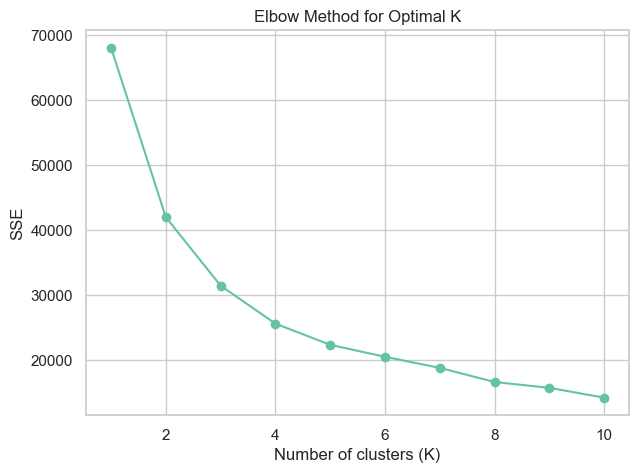

In [ ]:
def compute_sse(X, centers, labels):
    sse = 0
    for k in range(len(centers)):
        cluster_points = X[labels == k]
        sse += np.sum((cluster_points - centers[k]) ** 2)
    return sse

K_range = range(1, 11)
sse_list = []

for K in K_range:
    centers, labels, _ = kmeans(X_pca, K)
    sse = compute_sse(X_pca, centers[-1], labels[-1])
    sse_list.append(sse)

plt.figure(figsize=(7, 5))
plt.plot(K_range, sse_list, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('SSE')
plt.title('Elbow Method for Optimal K')
plt.grid(True)
plt.show()

PHÂN CỤM K-MEANS tại điểm gãy "khuỷu tay" K = 3

In [ ]:
K = 3

(centers, labels, it) = kmeans(X_pca, K)
print('Centers :')
print(centers[-1])

Centers :
[[-3.16164779 -0.33068671 -0.9275209  -0.28305676]
 [ 0.05920757  0.22834035  1.2897236   0.4348878 ]
 [ 3.1942775   0.0261947  -0.82643644 -0.30944549]]


ĐÁNH GIÁ ĐẦU RA PHÂN CỤM

In [ ]:
from scipy.stats import mode

y_pred = labels[-1]
mapping = {}
for cluster in range(3):
    true_labels = y_true[y_pred == cluster]
    mapping[cluster] = mode(true_labels, keepdims=True)[0][0]

print("Cluster → Label mapping:", mapping)

y_pred_mapped = np.vectorize(mapping.get)(y_pred)
acc = np.mean(y_pred_mapped == y_true)
print("Accuracy :", acc)
# Quan hệ giữa các mẫu dữ liệu đầu vào trong từng cụm
from sklearn.metrics import silhouette_score
print(confusion_matrix(y_true, y_pred_mapped))

Cluster → Label mapping: {0: np.int64(2), 1: np.int64(1), 2: np.int64(0)}
Accuracy : 0.6664
[[ 991  265  249]
 [ 455 1644  568]
 [  15  116  697]]


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(6, 5))
    plt.imshow(cm, cmap='Blues')
    plt.colorbar()

    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)

    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title("Confusion Matrix")

    # Hiển thị giá trị trong từng ô
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(
                j, i, cm[i, j],
                ha="center", va="center",
                color="white" if cm[i, j] > cm.max()/2 else "black"
            )

    plt.tight_layout()
    plt.show()


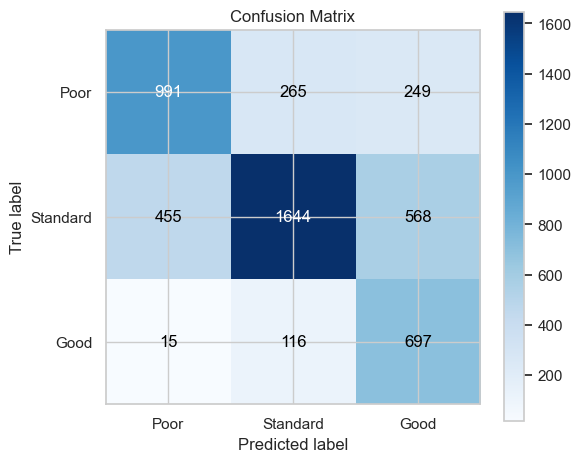

In [ ]:

cm = confusion_matrix(y_true, y_pred_mapped)

class_names = ['Poor', 'Standard', 'Good']
plot_confusion_matrix(cm, class_names)

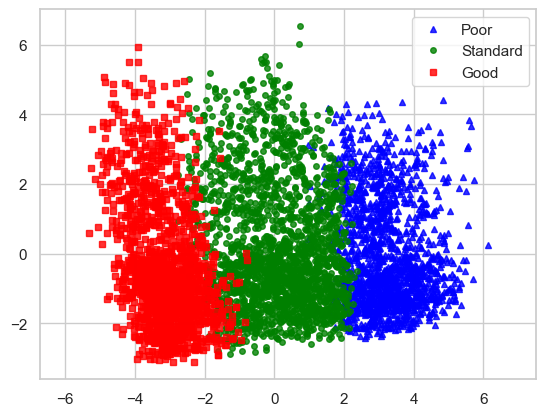

In [ ]:
kmeans_display(X_pca, y_pred_mapped)

ĐÁNH GIÁ DỮ LIỆU ĐẦU VÀO PHÂN CỤM

In [ ]:
# Quan hệ giữa các mẫu dữ liệu đầu vào trong từng cụm
from sklearn.metrics import silhouette_score

sil_score = silhouette_score(X_pca, y_pred)
print("Silhouette Score:", sil_score)

Silhouette Score: 0.3188846182944797


TRỰC QUAN PHÂN CỤM DỮ LIỆU SAU MỖI LẦN LẶP

In [ ]:
from sklearn.decomposition import PCA

pca_vis = PCA(n_components=2)
X_vis = pca_vis.fit_transform(X_pca)


def kmeans_display_iter(X, labels, centers, title):
    K = np.max(labels) + 1
    markers = ['^', 'o', 's']
    colors = ['b', 'g', 'r']

    for k in range(K):
        Xk = X[labels == k]
        plt.scatter(
            Xk[:, 0], Xk[:, 1],
            c=colors[k], marker=markers[k],
            s=15, alpha=0.7,
            label=f'Cluster {k}'
        )

    # Chiếu tâm cụm 4D → 2D
    centers_2d = pca_vis.transform(centers)
    plt.scatter(
        centers_2d[:, 0], centers_2d[:, 1],
        c='black', marker='x', s=150,
        label='Centers'
    )

    plt.title(title)
    plt.legend()
    plt.axis('equal')
    plt.show()


In [ ]:
def kmeans_with_visualization(X, K):
    centers = kmeans_init_centers(X, K)
    it = 0

    while True:
        labels = kmeans_assign_labels(X, centers)

        kmeans_display_iter(
            X, labels, centers,
            title=f'Iteration {it}'
        )

        new_centers = kmeans_update_centers(X, labels, K)

        if has_converged(centers, new_centers):
            break

        centers = new_centers
        it += 1

    return centers, labels, it


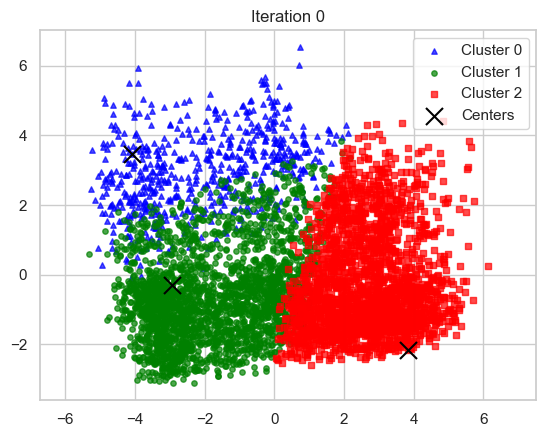

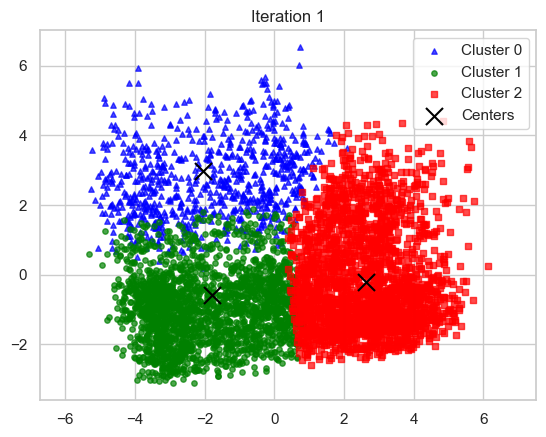

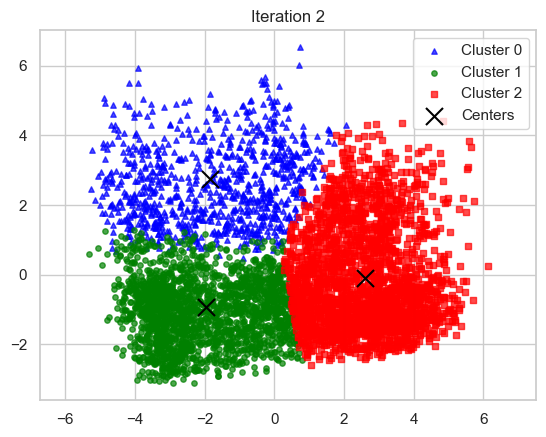

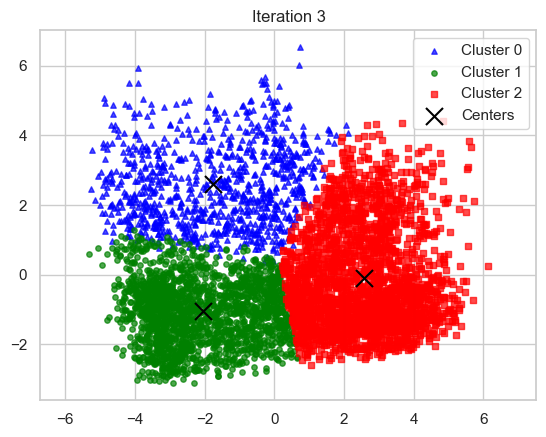

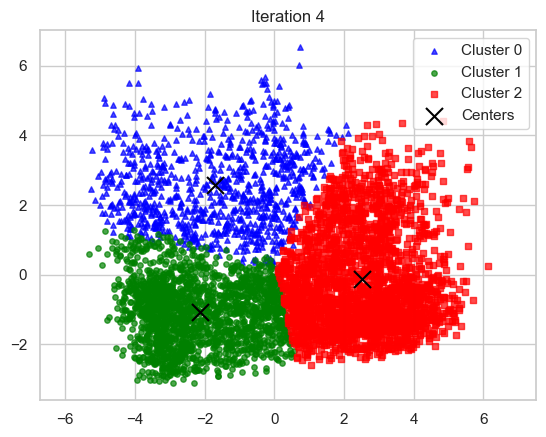

...

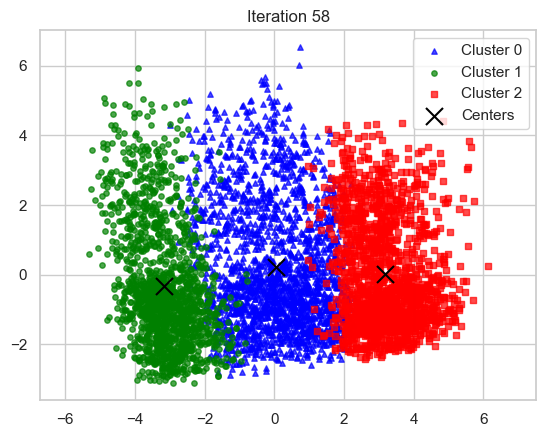

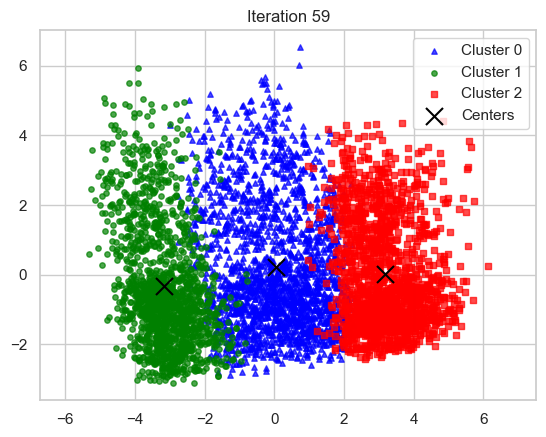

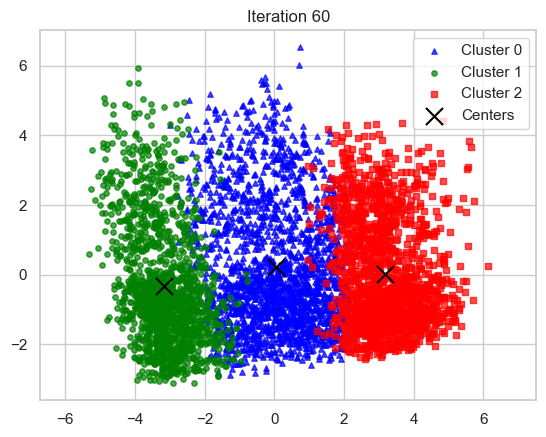

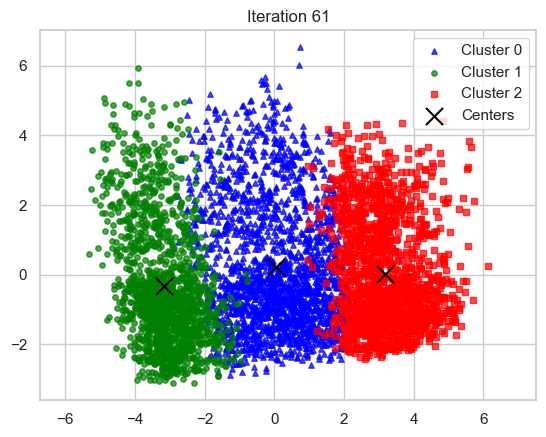

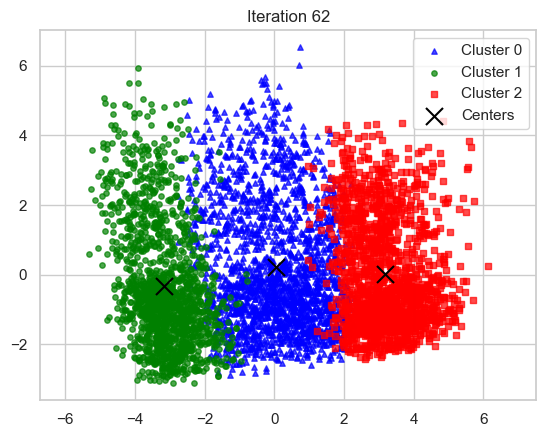

In [ ]:
final_centers, final_labels, n_iter = kmeans_with_visualization(
    X_pca, K=3
)

## 3.2 GMM

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
from scipy.stats import multivariate_normal


class GMM():
    def __init__(self, k, dim, init_mu=None, init_sigma=None, init_pi=None, colors=None):
        self.k = k
        self.dim = dim

        # Mean
        if init_mu is None:
            init_mu = np.random.rand(k, dim) * 20 - 10
        self.mu = init_mu

        # Covariance
        if init_sigma is None:
            init_sigma = np.zeros((k, dim, dim))
            for i in range(k):
                init_sigma[i] = np.eye(dim)
        self.sigma = init_sigma

        # Mixing coefficients
        if init_pi is None:
            init_pi = np.ones(self.k) / self.k
        self.pi = init_pi

        # Colors (for visualization)
        if colors is None:
            colors = np.random.rand(k, 3)
            for i in range(k):
                colors[i, 2] = i / k
        self.colors = colors

    def init_em(self, X):
        self.data = X
        self.num_points = X.shape[0]
        self.z = np.zeros((self.num_points, self.k))

    def e_step(self):
        for i in range(self.k):
            self.z[:, i] = self.pi[i] * multivariate_normal.pdf(
                self.data, mean=self.mu[i], cov=self.sigma[i]
            )
        self.z /= self.z.sum(axis=1, keepdims=True)

    def m_step(self):
        sum_z = self.z.sum(axis=0)

        self.pi = sum_z / self.num_points
        self.mu = np.matmul(self.z.T, self.data) / sum_z[:, None]

        for i in range(self.k):
            diff = self.data - self.mu[i]
            weighted_cov = np.zeros((self.dim, self.dim))
            for n in range(self.num_points):
                weighted_cov += self.z[n, i] * np.outer(diff[n], diff[n])
            self.sigma[i] = weighted_cov / sum_z[i]

    def log_likelihood(self, X):
        ll = 0
        for x in X:
            tmp = 0
            for i in range(self.k):
                tmp += self.pi[i] * multivariate_normal.pdf(
                    x, mean=self.mu[i], cov=self.sigma[i]
                )
            ll += np.log(tmp)
        return ll

    def plot_gaussian(self, mean, cov, ax, n_std=3.0, facecolor='none', **kwargs):
        pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
        ell_radius_x = np.sqrt(1 + pearson)
        ell_radius_y = np.sqrt(1 - pearson)

        ellipse = Ellipse(
            (0, 0),
            width=ell_radius_x * 2,
            height=ell_radius_y * 2,
            facecolor=facecolor,
            **kwargs
        )

        scale_x = np.sqrt(cov[0, 0]) * n_std
        scale_y = np.sqrt(cov[1, 1]) * n_std

        transf = transforms.Affine2D() \
            .rotate_deg(45) \
            .scale(scale_x, scale_y) \
            .translate(mean[0], mean[1])

        ellipse.set_transform(transf + ax.transData)
        ax.add_patch(ellipse)

    def draw(self, ax, n_std=2.0, facecolor='none', **kwargs):
        if self.dim != 2:
            print("Drawing available only for 2D case.")
            return
        for i in range(self.k):
            self.plot_gaussian(
                self.mu[i], self.sigma[i], ax,
                n_std=n_std, edgecolor=self.colors[i], **kwargs
            )


In [ ]:
import numpy as np
import random
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import multivariate_normal
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
import matplotlib.pyplot as plt

np.random.seed(11)
random.seed(11)

# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# PCA về 2D để huấn luyện + trực quan
pca_gmm = PCA(n_components=2)
X_gmm = pca_gmm.fit_transform(X_std)


In [ ]:
K = 3
dim = 2

gmm = GMM(
    k=K,
    dim=dim
)

gmm.init_em(X_gmm)


In [ ]:
max_iter = 100
tol = 1e-4

log_likelihoods = []

for it in range(max_iter):
    gmm.e_step()
    gmm.m_step()

    if it % 5 == 0:
        print(f"Iteration {it}")


Iteration 0
Iteration 5
Iteration 10
Iteration 15
Iteration 20
Iteration 25
Iteration 30
Iteration 35
Iteration 40
Iteration 45
Iteration 50
Iteration 55
Iteration 60
Iteration 65
Iteration 70
Iteration 75
Iteration 80
Iteration 85
Iteration 90
Iteration 95


In [ ]:
labels_gmm = np.argmax(gmm.z, axis=1)

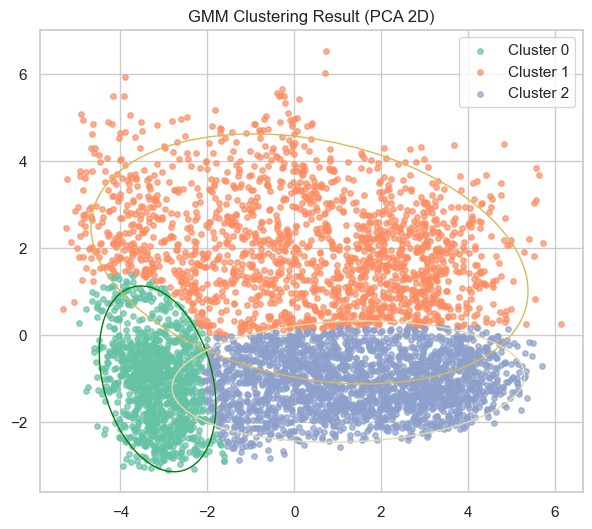

In [ ]:
fig, ax = plt.subplots(figsize=(7, 6))

for k in range(K):
    Xk = X_gmm[labels_gmm == k]
    ax.scatter(
        Xk[:, 0], Xk[:, 1],
        s=15, alpha=0.7,
        label=f'Cluster {k}'
    )

# Vẽ các Gaussian
gmm.draw(ax, n_std=2)

ax.set_title("GMM Clustering Result (PCA 2D)")
ax.legend()
ax.axis('equal')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score

sil_gmm = silhouette_score(X_gmm, labels_gmm)
print("GMM Silhouette Score:", sil_gmm)

GMM Silhouette Score: 0.31189193351768263


# 4 Phân loại

## 4.1 Huấn luyện mô hình K-NN

Hàm chuẩn bị dữ liệu cho training

In [ ]:
def prepare_datasets(X, y, train_size, random_state=42):
    """
    Hàm chia dữ liệu, chuẩn hoá và giảm chiều bằng PCA và LDA.
    Sau đó in ra các thành phần chính.
    """
    #Chia dữ liệu
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, train_size=train_size, random_state=random_state, stratify=y
    )

    #Chuẩn hoá dữ liệu
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_test_std = scaler.transform(X_test)

    # PCA
    pca = PCA(n_components=0.7)
    X_train_pca = pca.fit_transform(X_train_std)
    X_test_pca = pca.transform(X_test_std)

    # LDA
    lda = LDA(n_components=2)
    X_train_lda = lda.fit_transform(X_train_std, y_train)
    X_test_lda = lda.transform(X_test_std)

    return {
        "X_train": X_train,
        "X_test": X_test,
        "X_train_pca": X_train_pca,
        "X_test_pca": X_test_pca,
        "X_train_lda": X_train_lda,
        "X_test_lda": X_test_lda,
        "y_train": y_train,
        "y_test": y_test
    }


Hàm trực quan hoá và đánh giá tương quan

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def visualize_results(y_test, y_pred, title="KNN Results"):
    labels = ['Poor', 'Standard', 'Good']
    cm = confusion_matrix(y_test, y_pred, labels=labels)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Poor', 'Standard', 'Good'],
                yticklabels=['Poor', 'Standard', 'Good'])
    plt.xlabel("Dự đoán")
    plt.ylabel("Thực tế")
    plt.title(f"Ma trận nhầm lẫn - {title}")
    plt.show()

    # Phân bố số lượng dự đoán

    fig, ax = plt.subplots(1,2, figsize=(10,4))
    sns.countplot(x=y_test, ax=ax[0], order=['Poor', 'Standard', 'Good'])
    ax[0].set_title("Phân bố thực tế")

    sns.countplot(x=y_pred, ax=ax[1], order=['Poor', 'Standard', 'Good'])
    ax[1].set_title("Phân bố dự đoán")
    plt.suptitle(f"Phân bố dự đoán và thực tế - {title}")
    plt.show()


Hàm thực hiện train test

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import time
def trainAndTest(x, y, train_size, n_neighbors):
    data = prepare_datasets(X, y, train_size=train_size)
    x_train_ori = data["X_train"]
    x_test_ori = data["X_test"]
    y_train = data["y_train"]
    y_test = data["y_test"]

    # khi tạo ma trận nhầm lẫn sẽ đúng thứ tự lớp
    labels = ['Poor', 'Standard', 'Good']

    knn_model = KNeighborsClassifier(n_neighbors= n_neighbors, metric = 'euclidean')
    print("K=", n_neighbors)
    print("Huấn luyện - test với dữ liệu gốc: ...")
    time_start = time.time()
    knn_model.fit(x_train_ori, y_train)
    y_pred_ori =knn_model.predict(x_test_ori)
    time_stop = time.time()
    y_train_ori =knn_model.predict(x_train_ori)
    print("Thời gian chạy:", time_stop - time_start)
    print("Đánh giá với dữ liệu gốc:")
    # Độ chính xác
    print("Accuracy Train original data:", accuracy_score(y_train, y_train_ori))
    print("Accuracy Test original data:", accuracy_score(y_test, y_pred_ori))

    # Ma trận nhầm lẫn
    print("Ma trận nhầm lẫn")
    print(confusion_matrix(y_test, y_pred_ori, labels=labels))

    # Precision, Recall, F1-score cho từng lớp
    print(classification_report(y_test, y_pred_ori, target_names=['Poor', 'Standard', 'Good']))

    # PCA
    print("\n Huấn luyện - test với dữ liệu đã giảm PCA: ...")
    x_train_pca = data["X_train_pca"]
    x_test_pca = data["X_test_pca"]

    time_start = time.time()
    knn_model.fit(x_train_pca, y_train)
    y_pred_pca =knn_model.predict(x_test_pca)
    time_stop = time.time()
    y_train_pca =knn_model.predict(x_train_pca)
    print("Thời gian chạy:", time_stop - time_start)
    print("Đánh giá với dữ liệu đã giảm PCA:")
    # Độ chính xác
    print("Accuracy Train PCA data:", accuracy_score(y_train, y_train_pca))
    print("Accuracy PCA data:", accuracy_score(y_test, y_pred_pca))

    # Ma trận nhầm lẫn
    print("Ma trận nhầm lẫn")
    print(confusion_matrix(y_test, y_pred_pca, labels=labels))

    # Precision, Recall, F1-score cho từng lớp
    print(classification_report(y_test, y_pred_pca, target_names=['Poor', 'Standard', 'Good']))

    # LDA
    print("\n Huấn luyện - test với dữ liệu đã giảm LDA: ...")
    x_train_lda = data["X_train_lda"]
    x_test_lda = data["X_test_lda"]

    time_start = time.time()
    knn_model.fit(x_train_lda, y_train)
    y_pred_lda =knn_model.predict(x_test_lda)
    time_stop = time.time()
    y_train_lda =knn_model.predict(x_train_lda)
    print("Thời gian chạy:", time_stop - time_start)
    print("Đánh giá với dữ liệu đã giảm LDA:")
    # Độ chính xác
    print("Accuracy Train LDA data:", accuracy_score(y_train, y_train_lda))
    print("Accuracy LDA data:", accuracy_score(y_test, y_pred_lda))

    # Ma trận nhầm lẫn
    print("Ma trận nhầm lẫn")
    print(confusion_matrix(y_test, y_pred_lda, labels=labels))

    # Precision, Recall, F1-score cho từng lớp
    print(classification_report(y_test, y_pred_lda, target_names=['Poor', 'Standard', 'Good']))

    print("trực quan hóa và tương quan giữa dự đoán và thực tế")
    visualize_results(y_test, y_pred_lda, title="KNN Results")

### Tìm K tối ưu với K-fold CV

In [ ]:
from sklearn.model_selection import cross_val_score, KFold

def k_best(k_start):
    k_values = range(k_start - 10, k_start +10)
    cv_scores = []  # lưu độ chính xác trung bình cho mỗi k
    for k in k_values:
        knn = KNeighborsClassifier(n_neighbors=k, metric='euclidean')
        # 5-fold CV
        scores = cross_val_score(knn, X, y, cv=5, scoring='accuracy')
        mean_acc = scores.mean()
        cv_scores.append(mean_acc)

    # Tìm k tốt nhất
    best_k = k_values[np.argmax(cv_scores)]
    return best_k

K= 53
Huấn luyện - test với dữ liệu gốc: ...
Thời gian chạy: 0.031558990478515625
Đánh giá với dữ liệu gốc:
Accuracy Train original data: 0.619
Accuracy Test original data: 0.609
Ma trận nhầm lẫn
[[171 123   7]
 [ 95 428  10]
 [  4 152  10]]
              precision    recall  f1-score   support

        Poor       0.37      0.06      0.10       166
    Standard       0.63      0.57      0.60       301
        Good       0.61      0.80      0.69       533

    accuracy                           0.61      1000
   macro avg       0.54      0.48      0.47      1000
weighted avg       0.58      0.61      0.57      1000


 Huấn luyện - test với dữ liệu đã giảm PCA: ...
Thời gian chạy: 0.023920774459838867
Đánh giá với dữ liệu đã giảm PCA:
Accuracy Train PCA data: 0.668
Accuracy PCA data: 0.67
Ma trận nhầm lẫn
[[190  93  18]
 [ 77 404  52]
 [  2  88  76]]
              precision    recall  f1-score   support

        Poor       0.52      0.46      0.49       166
    Standard       0.71      0

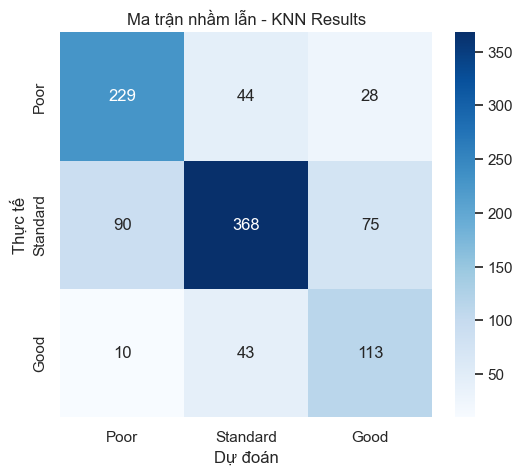

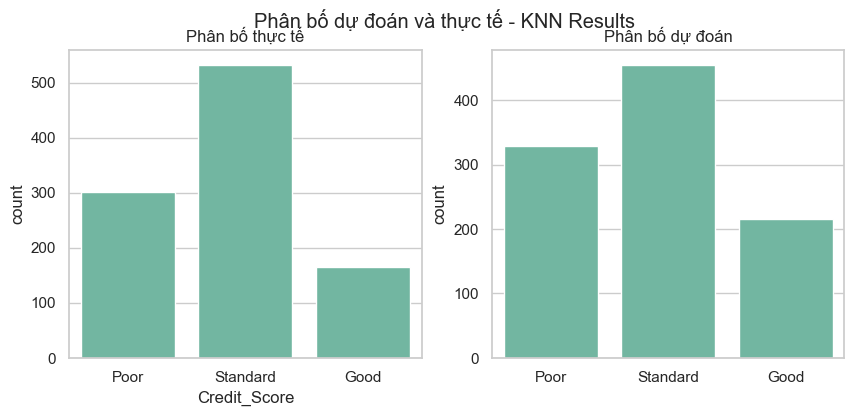

In [ ]:
trainAndTest(X, y, train_size = 0.8, n_neighbors = k_best(int(np.sqrt(X.shape[0] * 0.8))))

K= 53
Huấn luyện - test với dữ liệu gốc: ...
Thời gian chạy: 0.029230833053588867
Đánh giá với dữ liệu gốc:
Accuracy Train original data: 0.6094285714285714
Accuracy Test original data: 0.6126666666666667
Ma trận nhầm lẫn
[[260 187   5]
 [143 643  14]
 [  6 226  16]]
              precision    recall  f1-score   support

        Poor       0.46      0.06      0.11       248
    Standard       0.64      0.58      0.60       452
        Good       0.61      0.80      0.69       800

    accuracy                           0.61      1500
   macro avg       0.57      0.48      0.47      1500
weighted avg       0.59      0.61      0.57      1500


 Huấn luyện - test với dữ liệu đã giảm PCA: ...
Thời gian chạy: 0.03319358825683594
Đánh giá với dữ liệu đã giảm PCA:
Accuracy Train PCA data: 0.6677142857142857
Accuracy PCA data: 0.6553333333333333
Ma trận nhầm lẫn
[[279 148  25]
 [122 595  83]
 [  1 138 109]]
              precision    recall  f1-score   support

        Poor       0.50      0.4

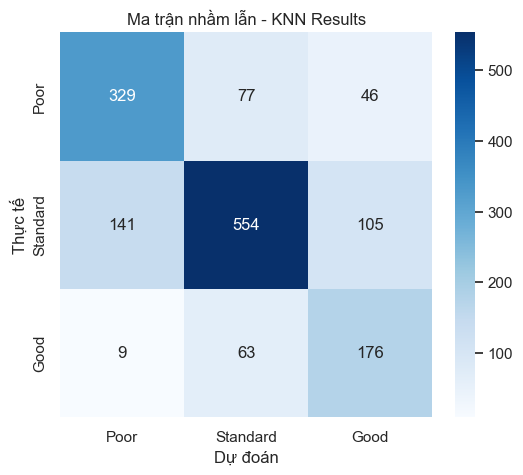

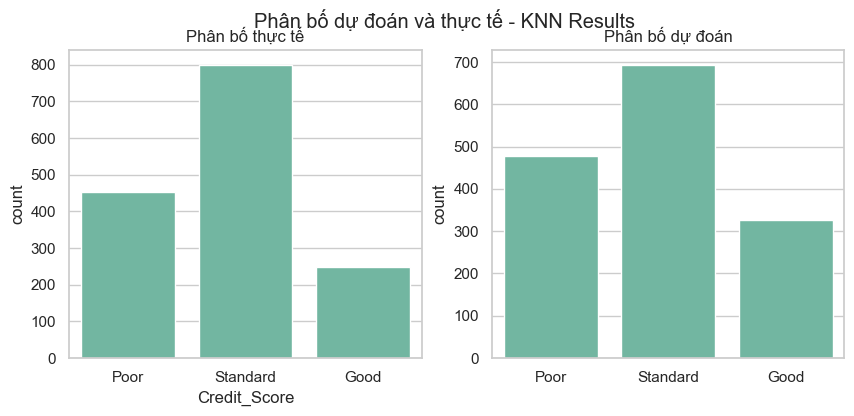

In [ ]:
trainAndTest(X, y, train_size = 0.7, n_neighbors = k_best(int(np.sqrt(X.shape[0] * 0.8))))

K= 53
Huấn luyện - test với dữ liệu gốc: ...
Thời gian chạy: 0.046959877014160156
Đánh giá với dữ liệu gốc:
Accuracy Train original data: 0.6083333333333333
Accuracy Test original data: 0.5985
Ma trận nhầm lẫn
[[317 277   8]
 [196 862   9]
 [  9 304  18]]
              precision    recall  f1-score   support

        Poor       0.51      0.05      0.10       331
    Standard       0.61      0.53      0.56       602
        Good       0.60      0.81      0.69      1067

    accuracy                           0.60      2000
   macro avg       0.57      0.46      0.45      2000
weighted avg       0.59      0.60      0.55      2000


 Huấn luyện - test với dữ liệu đã giảm PCA: ...
Thời gian chạy: 0.03743767738342285
Đánh giá với dữ liệu đã giảm PCA:
Accuracy Train PCA data: 0.6703333333333333
Accuracy PCA data: 0.6525
Ma trận nhầm lẫn
[[355 207  40]
 [158 803 106]
 [  2 182 147]]
              precision    recall  f1-score   support

        Poor       0.50      0.44      0.47       331
  

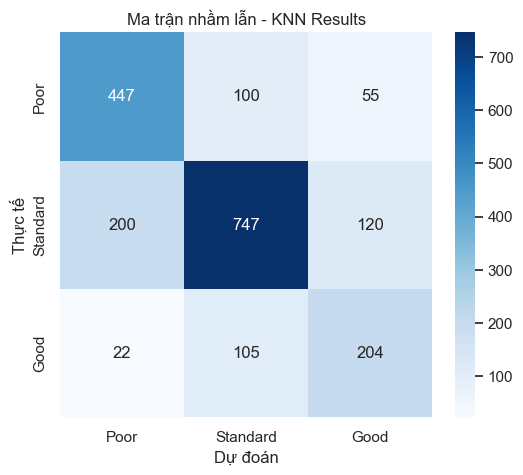

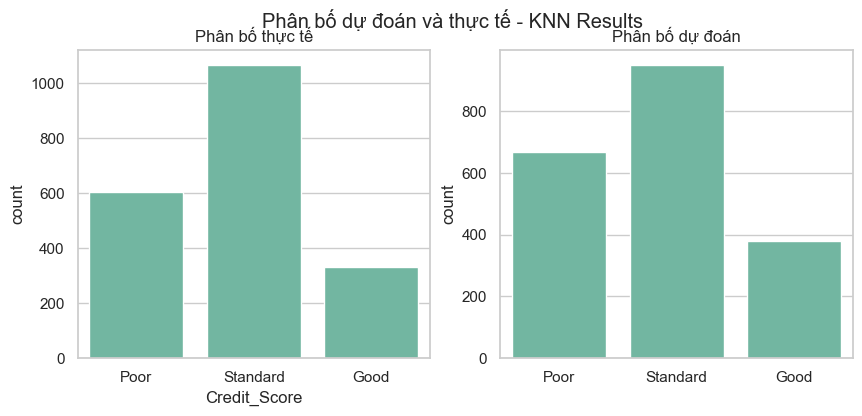

In [ ]:
trainAndTest(X, y, train_size = 0.6, n_neighbors = k_best(int(np.sqrt(X.shape[0] * 0.8))))

### Đánh giá:Độ chênh lệch giữa Accuracy train và test < 1.2% => không bị overfitting. Accuracy dạo động trong khoảng 61.5% - 62.3% (với dữ liệu Gốc) và 69-70% (với dữ liệu LDA), là mức tương đối cho mô hình K-NN

## 4.2 Mô hình Softmax Regression

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, StratifiedShuffleSplit, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline

from sklearn.cluster import KMeans
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    silhouette_score, davies_bouldin_score,
    adjusted_rand_score, normalized_mutual_info_score,
    mean_squared_error, mean_absolute_error, r2_score
)


In [ ]:
LABELS_ORDER = ['Poor', 'Standard', 'Good']

def prepare_split(X, y, train_size):
    X_train, X_val, y_train, y_val = train_test_split(
        X, y, train_size=train_size, random_state=42, stratify=y
    )
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_val_std = scaler.transform(X_val)

    # PCA 70% variance (fit on train only)
    pca = PCA(n_components=0.7, random_state=42)
    X_train_pca = pca.fit_transform(X_train_std)
    X_val_pca = pca.transform(X_val_std)

    # LDA 2D (fit on train only)
    lda = LDA(n_components=2)
    X_train_lda = lda.fit_transform(X_train_std, y_train)
    X_val_lda = lda.transform(X_val_std)

    return {
        'X_train_std': X_train_std, 'X_val_std': X_val_std,
        'X_train_pca': X_train_pca, 'X_val_pca': X_val_pca,
        'X_train_lda': X_train_lda, 'X_val_lda': X_val_lda,
        'y_train': y_train, 'y_val': y_val,
    }

def visualize_results(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred, labels=LABELS_ORDER)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=LABELS_ORDER, yticklabels=LABELS_ORDER)
    plt.title(title)
    plt.xlabel("Predicted"); plt.ylabel("True")
    plt.show()

    fig, ax = plt.subplots(1,2, figsize=(10,4))
    sns.countplot(x=y_true, ax=ax[0], order=LABELS_ORDER)
    ax[0].set_title("Phân bố thực tế")
    sns.countplot(x=y_pred, ax=ax[1], order=LABELS_ORDER)
    ax[1].set_title("Phân bố dự đoán")
    plt.suptitle(title + " - Distribution")
    plt.show()

def eval_softmax(X_tr, X_va, y_tr, y_va, title, tune_if_overfit=True):
    clf = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=2000, C=1.0)
    clf.fit(X_tr, y_tr)
    pred_tr = clf.predict(X_tr)
    pred_va = clf.predict(X_va)
    acc_tr = accuracy_score(y_tr, pred_tr)
    acc_va = accuracy_score(y_va, pred_va)
    gap = acc_tr - acc_va

    print(f"\n{title}")
    print(f"Train acc: {acc_tr:.4f} | Val acc: {acc_va:.4f} | Gap: {gap:.4f}")
    print(classification_report(y_va, pred_va, labels=LABELS_ORDER, target_names=LABELS_ORDER))
    visualize_results(y_va, pred_va, title + " (C=1.0)")

    tuned = None
    if tune_if_overfit and gap > 0.05:
        print("⚠️ Overfit suspected (gap>0.05). Tuning C...")
        grid = GridSearchCV(
            LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=2000),
            {'C':[0.01,0.1,1,10,100]},
            cv=4, scoring='accuracy', n_jobs=-1
        )
        grid.fit(X_tr, y_tr)
        best = grid.best_estimator_
        pred_va2 = best.predict(X_va)
        acc_va2 = accuracy_score(y_va, pred_va2)
        print("Best C:", grid.best_params_, " | Tuned Val acc:", round(acc_va2,4))
        visualize_results(y_va, pred_va2, title + f" (Tuned C={grid.best_params_['C']})")
        tuned = best
    return acc_tr, acc_va, gap, clf, tuned



Split train:val = 8:2

Original (std) [8:2]
Train acc: 0.7003 | Val acc: 0.6900 | Gap: 0.0103
              precision    recall  f1-score   support

        Poor       0.69      0.65      0.67       301
    Standard       0.75      0.73      0.74       533
        Good       0.53      0.63      0.57       166

    accuracy                           0.69      1000
   macro avg       0.66      0.67      0.66      1000
weighted avg       0.70      0.69      0.69      1000



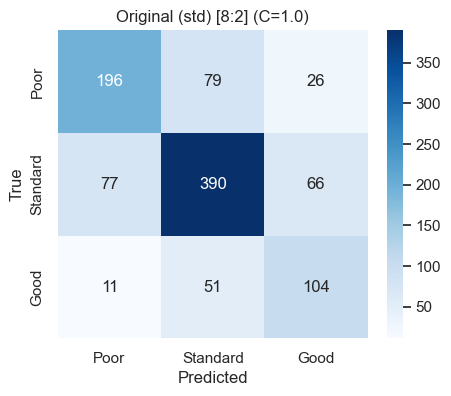

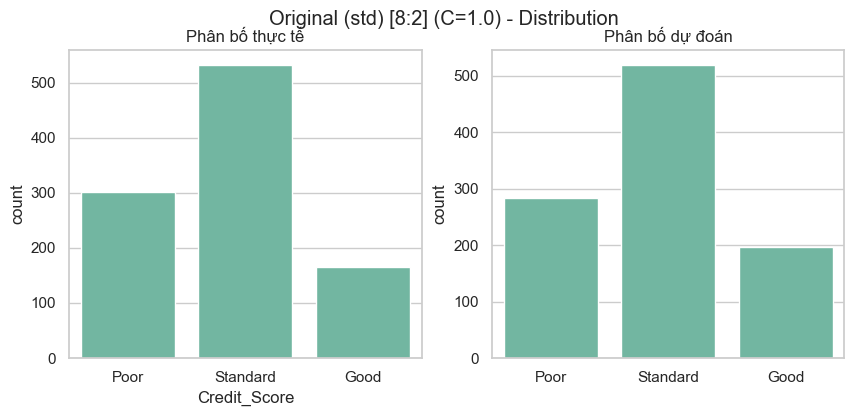


PCA(70% var) [8:2]
Train acc: 0.6498 | Val acc: 0.6610 | Gap: -0.0112
              precision    recall  f1-score   support

        Poor       0.68      0.56      0.61       301
    Standard       0.69      0.74      0.72       533
        Good       0.53      0.59      0.56       166

    accuracy                           0.66      1000
   macro avg       0.64      0.63      0.63      1000
weighted avg       0.66      0.66      0.66      1000



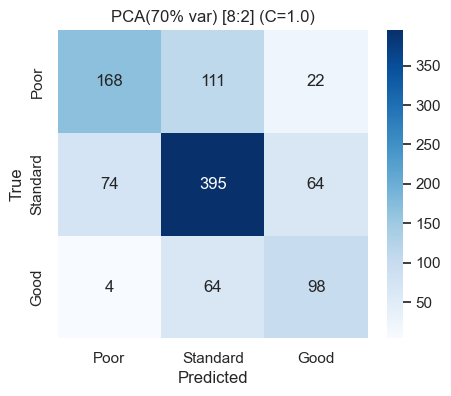

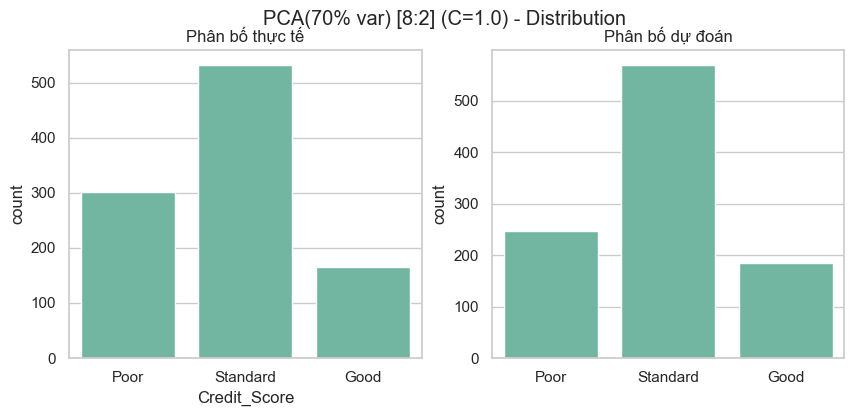


LDA(2D) [8:2]
Train acc: 0.6953 | Val acc: 0.6970 | Gap: -0.0017
              precision    recall  f1-score   support

        Poor       0.70      0.66      0.68       301
    Standard       0.76      0.73      0.74       533
        Good       0.53      0.66      0.59       166

    accuracy                           0.70      1000
   macro avg       0.66      0.68      0.67      1000
weighted avg       0.71      0.70      0.70      1000



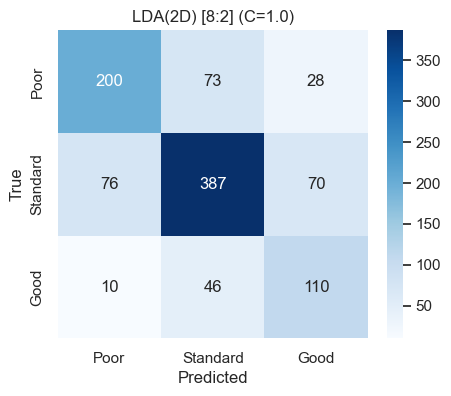

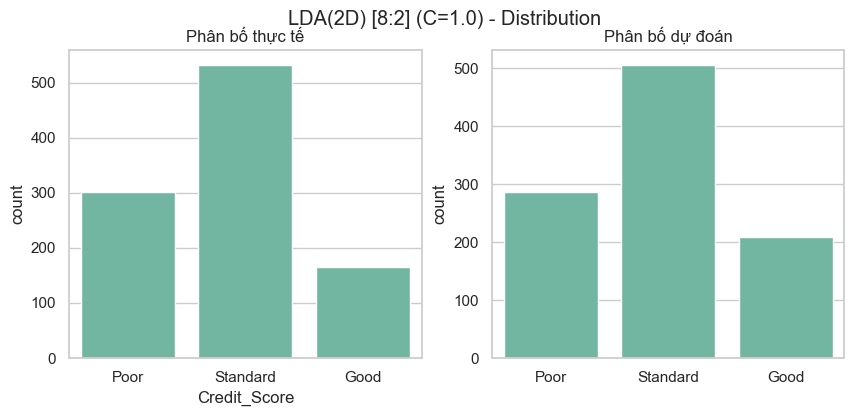


Split train:val = 7:3

Original (std) [7:3]
Train acc: 0.6963 | Val acc: 0.6800 | Gap: 0.0163
              precision    recall  f1-score   support

        Poor       0.68      0.63      0.66       452
    Standard       0.74      0.73      0.73       800
        Good       0.52      0.62      0.57       248

    accuracy                           0.68      1500
   macro avg       0.65      0.66      0.65      1500
weighted avg       0.69      0.68      0.68      1500



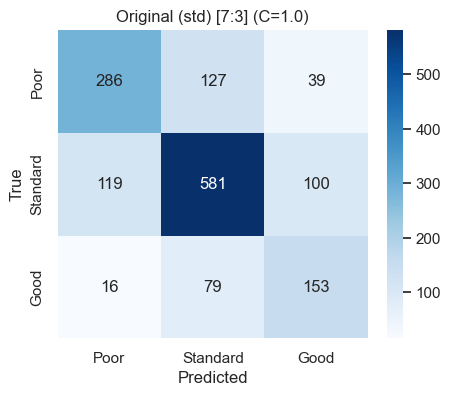

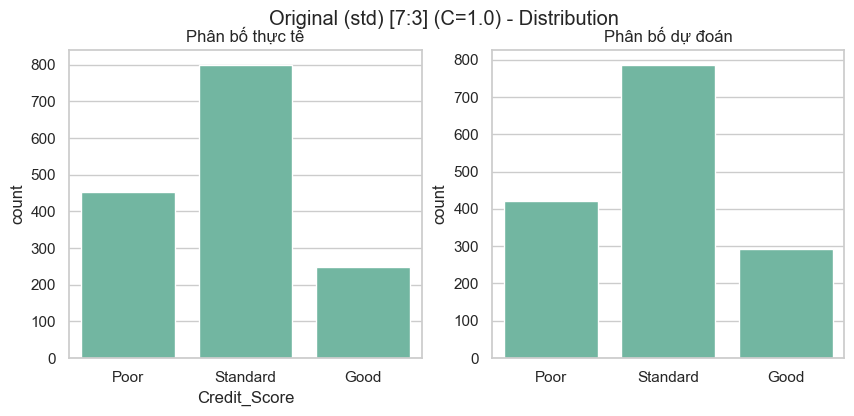


PCA(70% var) [7:3]
Train acc: 0.6543 | Val acc: 0.6480 | Gap: 0.0063
              precision    recall  f1-score   support

        Poor       0.68      0.54      0.60       452
    Standard       0.68      0.73      0.71       800
        Good       0.50      0.57      0.54       248

    accuracy                           0.65      1500
   macro avg       0.62      0.61      0.61      1500
weighted avg       0.65      0.65      0.65      1500



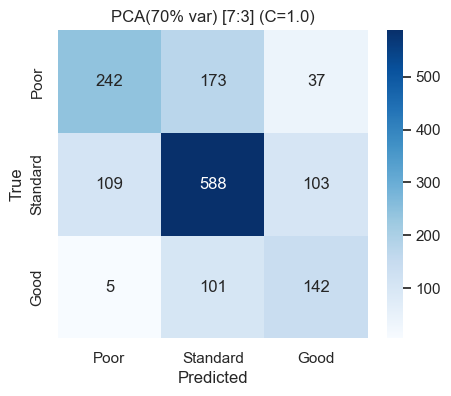

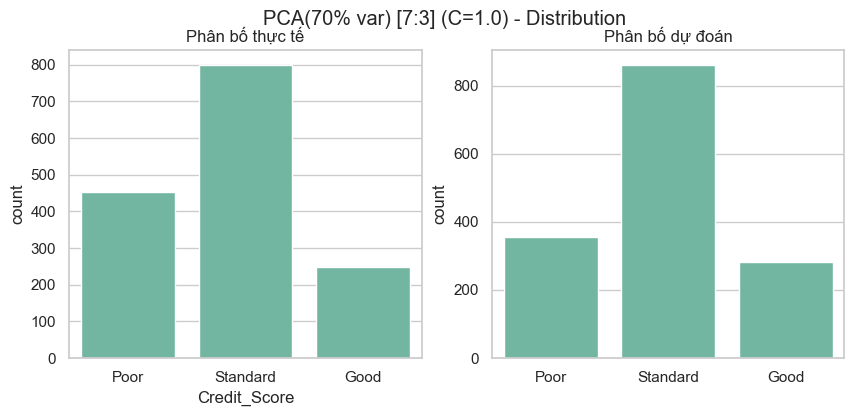


LDA(2D) [7:3]
Train acc: 0.6960 | Val acc: 0.6873 | Gap: 0.0087
              precision    recall  f1-score   support

        Poor       0.68      0.64      0.66       452
    Standard       0.76      0.72      0.74       800
        Good       0.52      0.68      0.59       248

    accuracy                           0.69      1500
   macro avg       0.66      0.68      0.66      1500
weighted avg       0.70      0.69      0.69      1500



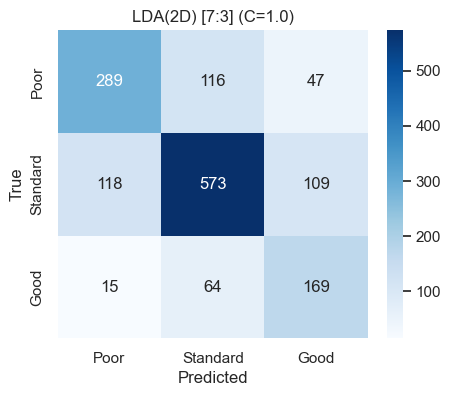

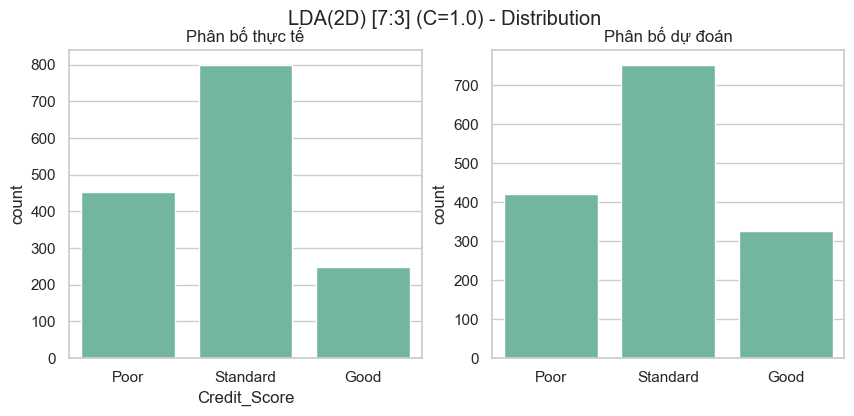


Split train:val = 6:4

Original (std) [6:4]
Train acc: 0.6977 | Val acc: 0.6835 | Gap: 0.0142
              precision    recall  f1-score   support

        Poor       0.68      0.63      0.66       602
    Standard       0.74      0.73      0.74      1067
        Good       0.54      0.61      0.57       331

    accuracy                           0.68      2000
   macro avg       0.65      0.66      0.65      2000
weighted avg       0.69      0.68      0.68      2000



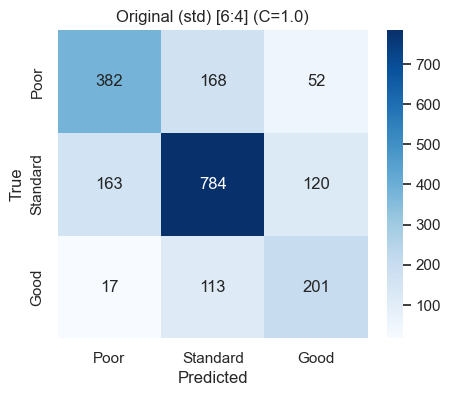

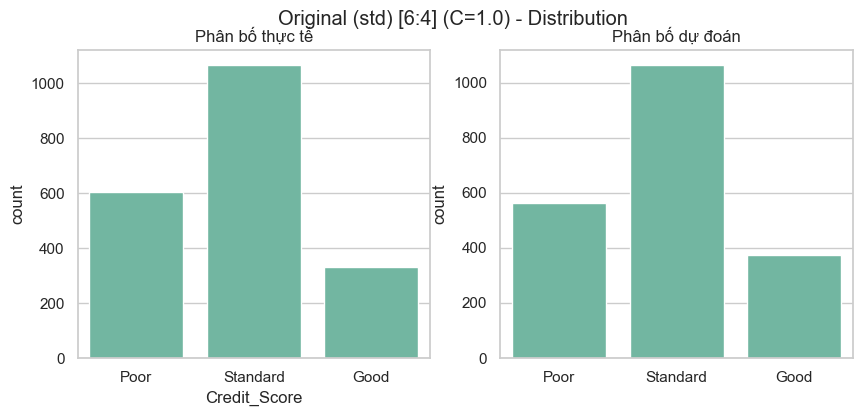


PCA(70% var) [6:4]
Train acc: 0.6530 | Val acc: 0.6435 | Gap: 0.0095
              precision    recall  f1-score   support

        Poor       0.67      0.52      0.59       602
    Standard       0.67      0.74      0.71      1067
        Good       0.51      0.54      0.52       331

    accuracy                           0.64      2000
   macro avg       0.62      0.60      0.61      2000
weighted avg       0.64      0.64      0.64      2000



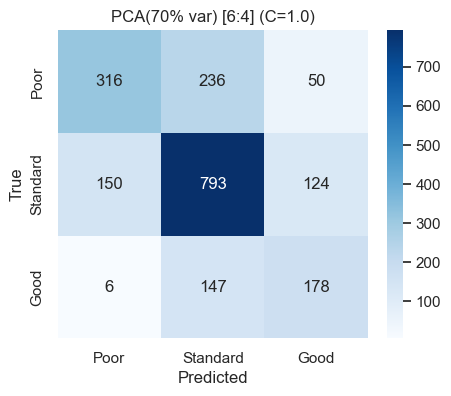

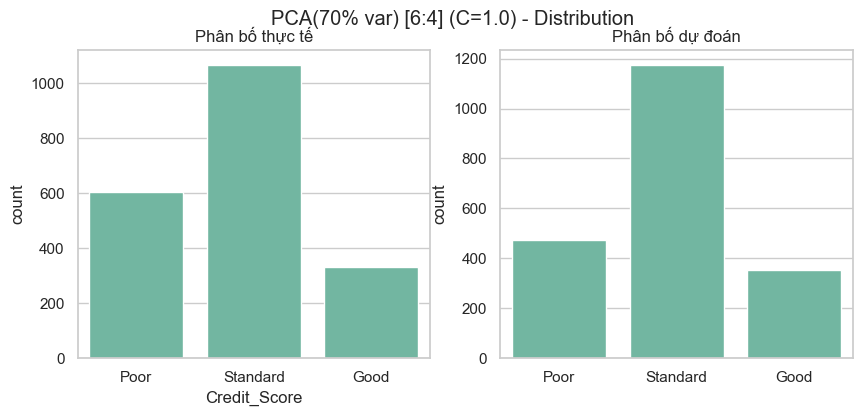


LDA(2D) [6:4]
Train acc: 0.6993 | Val acc: 0.6855 | Gap: 0.0138
              precision    recall  f1-score   support

        Poor       0.68      0.62      0.65       602
    Standard       0.75      0.72      0.74      1067
        Good       0.53      0.68      0.60       331

    accuracy                           0.69      2000
   macro avg       0.65      0.68      0.66      2000
weighted avg       0.69      0.69      0.69      2000



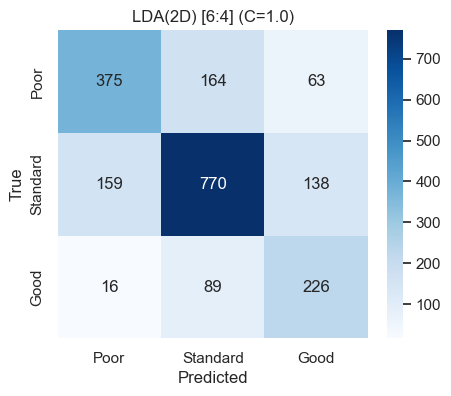

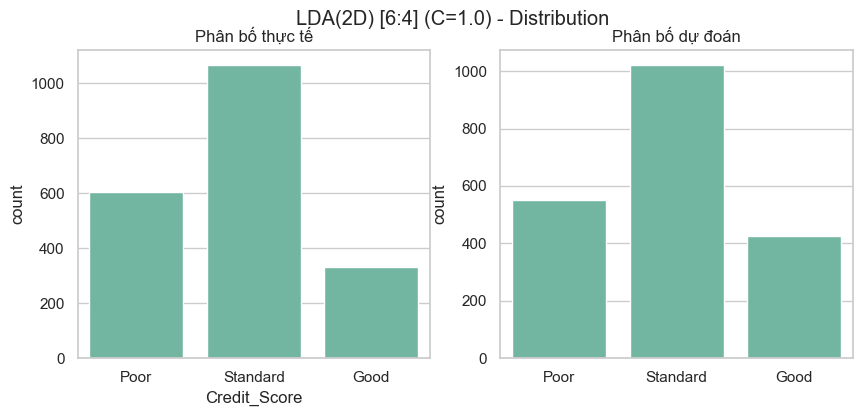

,split,input,train_acc,val_acc,gap
0,8:2,Original,0.700250,0.690000,0.010250
1,8:2,PCA,0.649750,0.661000,-0.011250
2,8:2,LDA,0.695250,0.697000,-0.001750
3,7:3,Original,0.696286,0.680000,0.016286
4,7:3,PCA,0.654286,0.648000,0.006286
5,7:3,LDA,0.696000,0.687333,0.008667
6,6:4,Original,0.697667,0.683500,0.014167
7,6:4,PCA,0.653000,0.643500,0.009500
8,6:4,LDA,0.699333,0.685500,0.013833


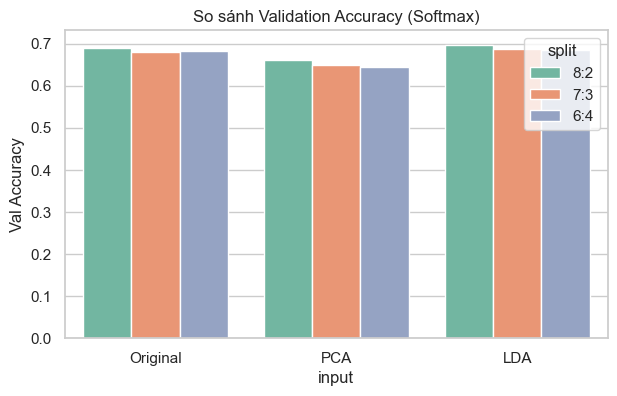

In [ ]:
# Chạy (a) + (b) theo 3 tỉ lệ
splits = [0.8, 0.7, 0.6]
summary_rows = []

for ts in splits:
    tr_ratio = int(round(ts*10)); va_ratio = int(round((1-ts)*10))
    print("\n" + "="*90)
    print(f"Split train:val = {tr_ratio}:{va_ratio}")
    data = prepare_split(X, y, train_size=ts)

    # Original
    a_tr, a_va, gap, clf_o, tuned_o = eval_softmax(
        data['X_train_std'], data['X_val_std'], data['y_train'], data['y_val'],
        title=f"Original (std) [{tr_ratio}:{va_ratio}]"
    )
    summary_rows.append({'split':f'{tr_ratio}:{va_ratio}','input':'Original','train_acc':a_tr,'val_acc':a_va,'gap':gap})

    # PCA
    a_tr, a_va, gap, clf_p, tuned_p = eval_softmax(
        data['X_train_pca'], data['X_val_pca'], data['y_train'], data['y_val'],
        title=f"PCA(70% var) [{tr_ratio}:{va_ratio}]"
    )
    summary_rows.append({'split':f'{tr_ratio}:{va_ratio}','input':'PCA','train_acc':a_tr,'val_acc':a_va,'gap':gap})

    # LDA
    a_tr, a_va, gap, clf_l, tuned_l = eval_softmax(
        data['X_train_lda'], data['X_val_lda'], data['y_train'], data['y_val'],
        title=f"LDA(2D) [{tr_ratio}:{va_ratio}]"
    )
    summary_rows.append({'split':f'{tr_ratio}:{va_ratio}','input':'LDA','train_acc':a_tr,'val_acc':a_va,'gap':gap})

summary_df = pd.DataFrame(summary_rows)
display(summary_df)

plt.figure(figsize=(7,4))
sns.barplot(data=summary_df, x='input', y='val_acc', hue='split')
plt.title("So sánh Validation Accuracy (Softmax)")
plt.ylabel("Val Accuracy")
plt.show()


## 4.3 Mô hình Crammer-Singer SVM

Hàm huấn luyện

In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import time

# SVM training and evaluation function
from sklearn.metrics import confusion_matrix

def train_and_evaluate_svm_crammer_singer(
    X, y, train_size=0.8, C=1.0
):
    """
    Train Linear SVM with Crammer–Singer multiclass formulation
    on Original, PCA and LDA datasets.
    """

    data = prepare_datasets(X, y, train_size=train_size)

    x_train_ori = data["X_train"]
    x_test_ori = data["X_test"]
    y_train = data["y_train"]
    y_test = data["y_test"]

    labels = ['Poor', 'Standard', 'Good']

    # ===== Scale original features =====
    scaler = StandardScaler()
    x_train_ori_std = scaler.fit_transform(x_train_ori)
    x_test_ori_std = scaler.transform(x_test_ori)

    # ===== Crammer–Singer Linear SVM =====
    svm = LinearSVC(
        C=C,
        multi_class='crammer_singer',
        max_iter=10000
    )

    print(f"Linear SVM (Crammer–Singer), C={C}")

    # ================= ORIGINAL =================
    print("\nTraining and testing on original (scaled) features...")
    t0 = time.time()
    svm.fit(x_train_ori_std, y_train)
    t1 = time.time()

    y_pred_ori = svm.predict(x_test_ori_std)
    y_train_pred = svm.predict(x_train_ori_std)

    print("Run time:", round(t1 - t0, 4), "seconds")
    print("Accuracy Train original:", accuracy_score(y_train, y_train_pred))
    print("Accuracy Test original:", accuracy_score(y_test, y_pred_ori))
    print("Confusion matrix (original):")
    print(confusion_matrix(y_test, y_pred_ori, labels=labels))
    print(classification_report(y_test, y_pred_ori, target_names=labels))

    # ================= PCA =================
    print("\nTraining and testing on PCA-reduced features...")
    x_train_pca = data["X_train_pca"]
    x_test_pca = data["X_test_pca"]

    t0 = time.time()
    svm.fit(x_train_pca, y_train)
    t1 = time.time()

    y_pred_pca = svm.predict(x_test_pca)
    y_train_pred_pca = svm.predict(x_train_pca)

    print("Run time:", round(t1 - t0, 4), "seconds")
    print("Accuracy Train PCA:", accuracy_score(y_train, y_train_pred_pca))
    print("Accuracy Test PCA:", accuracy_score(y_test, y_pred_pca))
    print("Confusion matrix (PCA):")
    print(confusion_matrix(y_test, y_pred_pca, labels=labels))
    print(classification_report(y_test, y_pred_pca, target_names=labels))

    # ================= LDA =================
    print("\nTraining and testing on LDA-reduced features...")
    x_train_lda = data["X_train_lda"]
    x_test_lda = data["X_test_lda"]

    t0 = time.time()
    svm.fit(x_train_lda, y_train)
    t1 = time.time()

    y_pred_lda = svm.predict(x_test_lda)
    y_train_pred_lda = svm.predict(x_train_lda)

    print("Run time:", round(t1 - t0, 4), "seconds")
    print("Accuracy Train LDA:", accuracy_score(y_train, y_train_pred_lda))
    print("Accuracy Test LDA:", accuracy_score(y_test, y_pred_lda))
    print("Confusion matrix (LDA):")
    print(confusion_matrix(y_test, y_pred_lda, labels=labels))
    print(classification_report(y_test, y_pred_lda, target_names=labels))

    # ===== Visualization =====
    try:
        visualize_results(y_test, y_pred_lda,
                          title="Linear SVM (Crammer–Singer) - LDA")
    except Exception as e:
        print("Could not produce visualization:", e)

    return {
        'y_test': y_test,
        'y_pred_ori': y_pred_ori,
        'y_pred_pca': y_pred_pca,
        'y_pred_lda': y_pred_lda
    }

# Example runs (uncomment or run in separate cell as needed)
#run_results = train_and_evaluate_svm(X, y, train_size=0.8, kernel='rbf', C=1.0, gamma='scale')
#run_results_linear = train_and_evaluate_svm(X, y, train_size=0.8, kernel='linear', C=1.0)


Tỉ lệ chia 4:1

Linear SVM (Crammer–Singer), C=1.0

Training and testing on original (scaled) features...
Run time: 5.8191 seconds
Accuracy Train original: 0.69925
Accuracy Test original: 0.699
Confusion matrix (original):
[[217  51  33]
 [ 96 358  79]
 [ 11  31 124]]
              precision    recall  f1-score   support

        Poor       0.53      0.75      0.62       166
    Standard       0.67      0.72      0.69       301
        Good       0.81      0.67      0.74       533

    accuracy                           0.70      1000
   macro avg       0.67      0.71      0.68      1000
weighted avg       0.72      0.70      0.70      1000


Training and testing on PCA-reduced features...
Run time: 1.6723 seconds
Accuracy Train PCA: 0.6405
Accuracy Test PCA: 0.655
Confusion matrix (PCA):
[[180 105  16]
 [ 80 411  42]
 [ 17  85  64]]
              precision    recall  f1-score   support

        Poor       0.52      0.39      0.44       166
    Standard       0.65      0.60      0.62       301
       

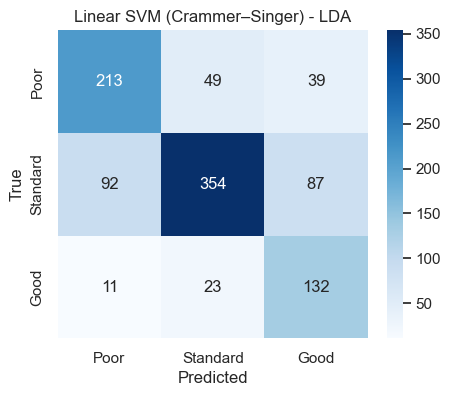

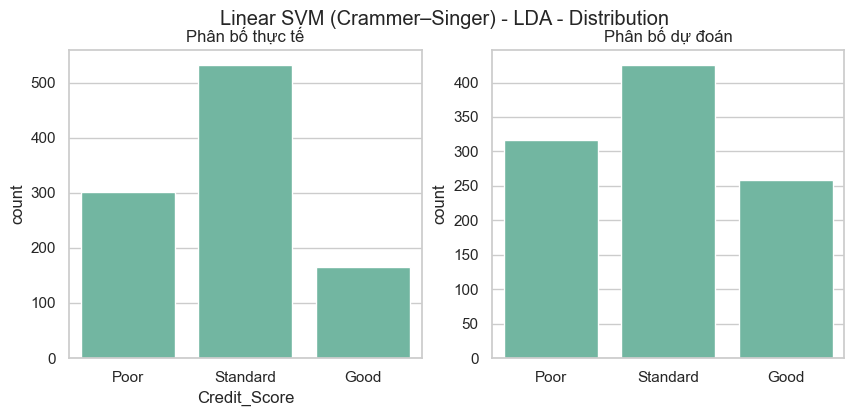

{'y_test': 19745        Good
 2712     Standard
 51046        Poor
 36384    Standard
 88989    Standard
            ...   
 13672    Standard
 2486     Standard
 44305        Poor
 58397    Standard
 89115    Standard
 Name: Credit_Score, Length: 1000, dtype: object,
 'y_pred_ori': array(['Good', 'Standard', 'Poor', 'Poor', 'Standard', 'Poor', 'Standard',
        'Good', 'Standard', 'Good', 'Poor', 'Good', 'Standard', 'Good',
        'Standard', 'Good', 'Poor', 'Poor', 'Standard', 'Standard', 'Good',
        'Standard', 'Standard', 'Good', 'Poor', 'Standard', 'Standard',
        'Poor', 'Good', 'Standard', 'Standard', 'Poor', 'Poor', 'Standard',
        'Good', 'Poor', 'Good', 'Standard', 'Standard', 'Standard', 'Poor',
        'Standard', 'Standard', 'Poor', 'Poor', 'Poor', 'Poor', 'Standard',
        'Poor', 'Good', 'Standard', 'Good', 'Standard', 'Standard',
        'Standard', 'Standard', 'Standard', 'Good', 'Standard', 'Standard',
        'Good', 'Standard', 'Standard', 'Standard

In [ ]:
train_and_evaluate_svm_crammer_singer(
    X, y,
    train_size=0.8,
    C=1.0
)

Tỉ lệ chia 7:3

Linear SVM (Crammer–Singer), C=1.0

Training and testing on original (scaled) features...
Run time: 4.4009 seconds
Accuracy Train original: 0.6971428571428572
Accuracy Test original: 0.6913333333333334
Confusion matrix (original):
[[313  90  49]
 [142 541 117]
 [ 18  47 183]]
              precision    recall  f1-score   support

        Poor       0.52      0.74      0.61       248
    Standard       0.66      0.69      0.68       452
        Good       0.80      0.68      0.73       800

    accuracy                           0.69      1500
   macro avg       0.66      0.70      0.67      1500
weighted avg       0.71      0.69      0.70      1500


Training and testing on PCA-reduced features...
Run time: 1.7341 seconds
Accuracy Train PCA: 0.6488571428571429
Accuracy Test PCA: 0.6393333333333333
Confusion matrix (PCA):
[[255 166  31]
 [121 606  73]
 [ 24 126  98]]
              precision    recall  f1-score   support

        Poor       0.49      0.40      0.44       248
    Standard

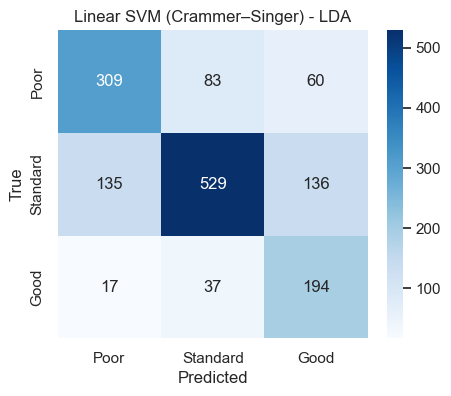

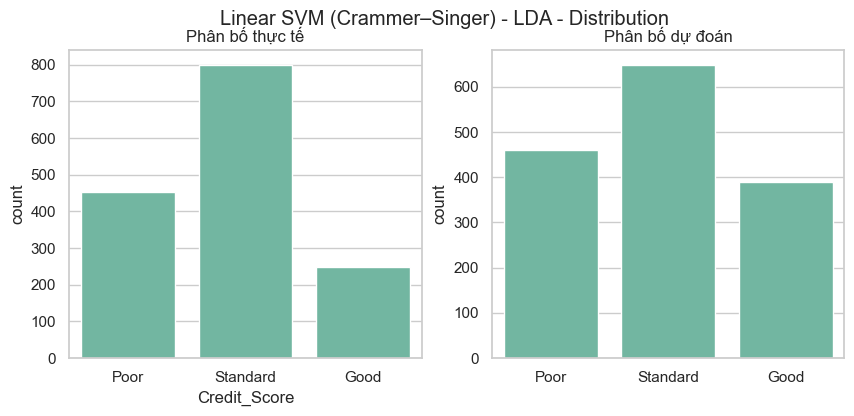

{'y_test': 47724    Standard
 58204    Standard
 77827        Poor
 79881    Standard
 52903    Standard
            ...   
 8665         Good
 88399        Poor
 84724        Good
 35946    Standard
 98073    Standard
 Name: Credit_Score, Length: 1500, dtype: object,
 'y_pred_ori': array(['Standard', 'Standard', 'Poor', ..., 'Standard', 'Standard',
        'Standard'], shape=(1500,), dtype=object),
 'y_pred_pca': array(['Standard', 'Standard', 'Standard', ..., 'Standard', 'Standard',
        'Standard'], shape=(1500,), dtype=object),
 'y_pred_lda': array(['Standard', 'Standard', 'Poor', ..., 'Good', 'Standard',
        'Standard'], shape=(1500,), dtype=object)}

In [ ]:
train_and_evaluate_svm_crammer_singer(
    X, y,
    train_size=0.7,
    C=1.0
)

Tỉ lệ chia 6:4

Linear SVM (Crammer–Singer), C=1.0

Training and testing on original (scaled) features...
Run time: 5.3297 seconds
Accuracy Train original: 0.7033333333333334
Accuracy Test original: 0.6885
Confusion matrix (original):
[[413 123  66]
 [199 720 148]
 [ 23  64 244]]
              precision    recall  f1-score   support

        Poor       0.53      0.74      0.62       331
    Standard       0.65      0.69      0.67       602
        Good       0.79      0.67      0.73      1067

    accuracy                           0.69      2000
   macro avg       0.66      0.70      0.67      2000
weighted avg       0.71      0.69      0.69      2000


Training and testing on PCA-reduced features...
Run time: 1.2825 seconds
Accuracy Train PCA: 0.652
Accuracy Test PCA: 0.6435
Confusion matrix (PCA):
[[337 223  42]
 [162 808  97]
 [ 29 160 142]]
              precision    recall  f1-score   support

        Poor       0.51      0.43      0.46       331
    Standard       0.64      0.56      0.60      

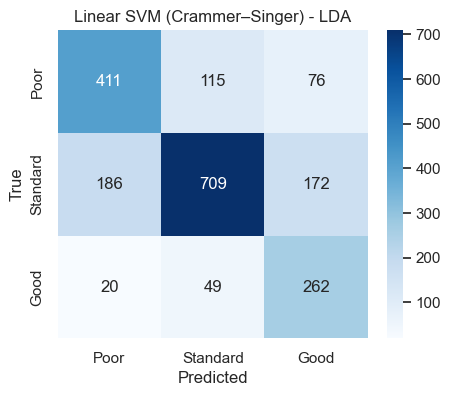

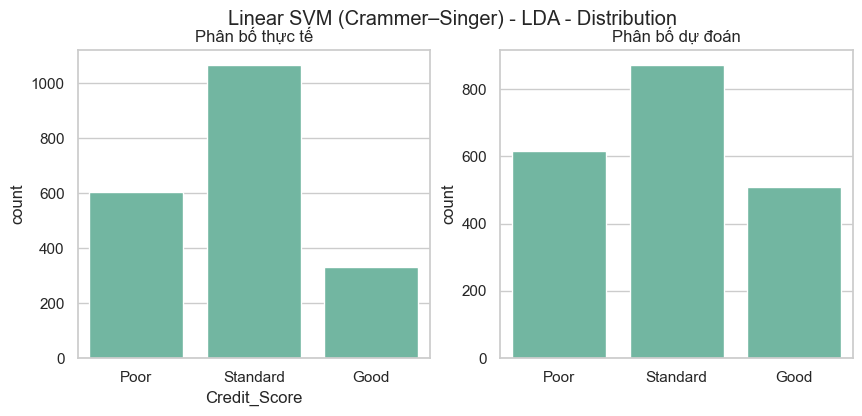

{'y_test': 88745        Poor
 8744     Standard
 647      Standard
 59768    Standard
 35686        Good
            ...   
 10267    Standard
 91277    Standard
 53476        Good
 47261    Standard
 56064        Poor
 Name: Credit_Score, Length: 2000, dtype: object,
 'y_pred_ori': array(['Poor', 'Good', 'Standard', ..., 'Good', 'Standard', 'Poor'],
       shape=(2000,), dtype=object),
 'y_pred_pca': array(['Poor', 'Good', 'Standard', ..., 'Good', 'Standard', 'Poor'],
       shape=(2000,), dtype=object),
 'y_pred_lda': array(['Poor', 'Good', 'Standard', ..., 'Good', 'Standard', 'Poor'],
       shape=(2000,), dtype=object)}

In [ ]:
train_and_evaluate_svm_crammer_singer(
    X, y,
    train_size=0.6,
    C=1.0
)

# 5. Chuyển sang hồi quy

Label encoding cột mục tiêu

In [ ]:
# Biến đổi cột mục tiêu về 1, 2, 3 ứNg với Poor, Standard, Good
def transform_target(y):
    mapping = {'Poor': 1, 'Standard': 2, 'Good': 3}
    return y.map(mapping)
y_transformed = transform_target(y)

# Thực hiện huấn luyện bằng SVM với y đã biến đổi

## 5.1 Mô hình Ridge Regression

### Chuyển bài toán về dạng hồi quy theo hàm quyết định của 1 phân lớp
Chọn phân lớp **Good**. Dùng **giá trị hàm quyết định** dưới dạng xác suất softmax \(P(y=Good|x)\) làm **đầu ra mới** \(y_{reg}\).
- Chia train:test như (a) (0.8/0.7/0.6; stratify theo nhãn phân loại)  
- Thực hiện **2 mô hình hồi quy**: **Ridge Regression** và **SVR (RBF)**  
- So sánh với input **nguyên bản (standardized)** và input giảm còn **1/3 số chiều (PCA)**

,split,input,model,rmse,mae,r2
0,8:2,Original_std,Ridge,0.066391,0.047668,0.910840
1,8:2,PCA_1over3(d=16),Ridge,0.114915,0.085442,0.732880
2,8:2,Original_std,SVR_RBF,0.065549,0.055406,0.913085
3,8:2,PCA_1over3(d=16),SVR_RBF,0.097548,0.071687,0.807519
4,7:3,Original_std,Ridge,0.066645,0.047869,0.910151
5,7:3,PCA_1over3(d=16),Ridge,0.112074,0.083102,0.745909
6,7:3,Original_std,SVR_RBF,0.066210,0.056507,0.911321
7,7:3,PCA_1over3(d=16),SVR_RBF,0.094382,0.070652,0.819801
8,6:4,Original_std,Ridge,0.065932,0.047756,0.909001
9,6:4,PCA_1over3(d=16),Ridge,0.111916,0.083773,0.737799


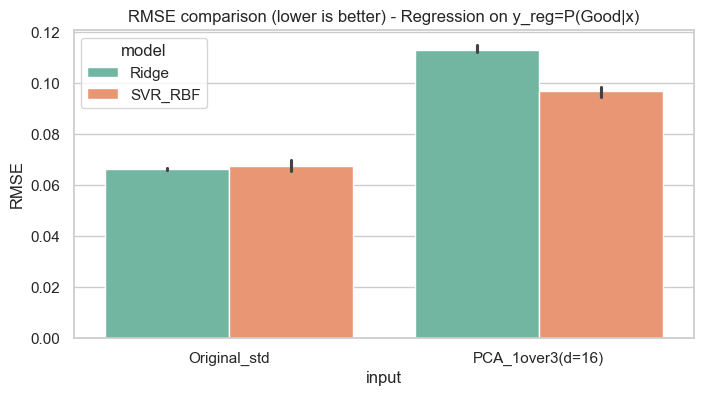

In [ ]:
import copy
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def make_pca_1over3(X_train_std, X_test_std):
    d = X_train_std.shape[1]
    n_comp = max(1, d // 3)
    pca = PCA(n_components=n_comp, random_state=42)
    Xtr = pca.fit_transform(X_train_std)
    Xte = pca.transform(X_test_std)
    return Xtr, Xte, n_comp

def eval_regression(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)   # không dùng squared=False
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return rmse, mae, r2


def run_regression_experiments(X, y_cls, train_sizes=(0.8,0.7,0.6), target_class='Good'):
    records=[]
    for train_size in train_sizes:
        tr_ratio = int(round(train_size*10))
        te_ratio = int(round((1-train_size)*10))

        # split classification labels for stratify
        X_train, X_test, y_train_cls, y_test_cls = train_test_split(
            X, y_cls, train_size=train_size, random_state=42, stratify=y_cls
        )

        # standardize inputs
        scaler = StandardScaler()
        X_train_std = scaler.fit_transform(X_train)
        X_test_std = scaler.transform(X_test)

        # Create y_reg from softmax probability of target_class
        clf = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=2000, C=1.0)
        clf.fit(X_train_std, y_train_cls)
        proba_train = clf.predict_proba(X_train_std)
        proba_test = clf.predict_proba(X_test_std)

        class_to_idx = {lab:i for i,lab in enumerate(clf.classes_)}
        idx = class_to_idx[target_class]

        yreg_train = proba_train[:, idx]
        yreg_test = proba_test[:, idx]

        # PCA to 1/3 dims
        X_train_pca, X_test_pca, n_comp = make_pca_1over3(X_train_std, X_test_std)

        regressors = {
            "Ridge": Ridge(alpha=1.0),
            "SVR_RBF": Pipeline([('scaler', StandardScaler()), ('svr', SVR(kernel='rbf'))])
        }

        for name, model in regressors.items():
            # Original
            m1 = copy.deepcopy(model)
            m1.fit(X_train_std, yreg_train)
            pred = m1.predict(X_test_std)
            rmse, mae, r2 = eval_regression(yreg_test, pred)
            records.append({
                "split": f"{tr_ratio}:{te_ratio}",
                "input": "Original_std",
                "model": name,
                "rmse": rmse, "mae": mae, "r2": r2
            })

            # PCA 1/3
            m2 = copy.deepcopy(model)
            m2.fit(X_train_pca, yreg_train)
            pred2 = m2.predict(X_test_pca)
            rmse2, mae2, r22 = eval_regression(yreg_test, pred2)
            records.append({
                "split": f"{tr_ratio}:{te_ratio}",
                "input": f"PCA_1over3(d={n_comp})",
                "model": name,
                "rmse": rmse2, "mae": mae2, "r2": r22
            })

    return pd.DataFrame(records)

reg_df = run_regression_experiments(X, y, train_sizes=(0.8,0.7,0.6), target_class='Good')
display(reg_df)

plt.figure(figsize=(8,4))
sns.barplot(data=reg_df, x='input', y='rmse', hue='model')
plt.title("RMSE comparison (lower is better) - Regression on y_reg=P(Good|x)")
plt.ylabel("RMSE")
plt.show()


## 5.2 Mô hình SVR

Hàm trực quan hoá

In [ ]:
def visualize_regression_results(y_true, y_pred, title="SVR Results", show_residuals=True, show_hist=False, show_qq=False):
    """Enhanced regression-style visualization matching the requested layout.

    Plots and prints:
    - Metrics: R2, RMSE, MAE with formatted output
    - Left: scatter Actual vs Predicted with y=x reference
    - Right: residuals (Actual - Predicted) vs Predicted with horizontal 0 line
    - Separate figure: first 100 samples Actual vs Predicted line plot

    Inputs:
    - y_true, y_pred: array-like (same length)
    - title: main title used on the scatter plot
    """
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

    # Convert to numpy arrays
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    # Compute metrics
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    # Print formatted results (currency-style for errors if numbers are large)
    print("\n" + "="*50)
    print("📊 KẾT QUẢ ĐÁNH GIÁ (MODEL TRÊN DỮ LIỆU GỐC)")
    print("="*50)
    print(f" 1️⃣  R2 Score (Độ phù hợp): {r2:.4f} (Max là 1.0)")
    # Format RMSE/MAE with thousands separator and no decimals as in your example
    try:
        print(f" 2️⃣  RMSE (Sai số chuẩn):   ${rmse:,.0f}")
        print(f" 3️⃣  MAE (Sai số tuyệt đối):${mae:,.0f}")
    except Exception:
        # Fallback if values are small or not monetary
        print(f" 2️⃣  RMSE (Sai số chuẩn):   {rmse:.4f}")
        print(f" 3️⃣  MAE (Sai số tuyệt đối):{mae:.4f}")
    print("-" * 50)

    # Quick assessment
    if r2 > 0.85:
        print("✅ Đánh giá: Mô hình RẤT TỐT. Dữ liệu gốc cung cấp đầy đủ thông tin.")
    elif r2 > 0.70:
        print("⚠️ Đánh giá: Mô hình KHÁ. Có thể cải thiện bằng cách xử lý thêm Outliers.")
    else:
        print("❌ Đánh giá: Mô hình KÉM. Cần xem lại các bước xử lý dữ liệu.")

    # --- PLOT: Actual vs Predicted and Residuals ---
    plt.figure(figsize=(16, 6))

    # Subplot 1: Actual vs Predicted scatter
    ax1 = plt.subplot(1, 2, 1)
    min_val = min(np.nanmin(y_true), np.nanmin(y_pred))
    max_val = max(np.nanmax(y_true), np.nanmax(y_pred))

    sns.scatterplot(x=y_true, y=y_pred, color='#2c3e50', alpha=0.6, s=50, ax=ax1)
    ax1.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Dự đoán hoàn hảo')
    ax1.set_title(f'{title} (R² = {r2:.3f})', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Giá Thực Tế (Actual)')
    ax1.set_ylabel('Giá Dự Đoán (Predicted)')
    ax1.legend()
    ax1.grid(True, linestyle=':', alpha=0.6)

    # Subplot 2: Residuals vs Predicted
    residuals = y_true - y_pred
    ax2 = plt.subplot(1, 2, 2)
    sns.scatterplot(x=y_pred, y=residuals, color='#e74c3c', alpha=0.6, s=50, ax=ax2)
    ax2.axhline(0, color='black', linestyle='--', lw=2)
    ax2.set_title('Biểu đồ phần dư (Residual Plot)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Giá Dự Đoán')
    ax2.set_ylabel('Sai số (Residuals)')
    ax2.grid(True, linestyle=':', alpha=0.6)

    plt.tight_layout()
    plt.show()

    # --- PLOT: First 100 samples comparison ---
    try:
        n_samples = 100
        plt.figure(figsize=(14, 5))
        x_ax = range(n_samples)
        # If arrays shorter than n_samples, adjust
        max_n = min(n_samples, len(y_true))
        plt.plot(x_ax[:max_n], y_true[:max_n], label='Thực tế', color='blue', linewidth=2)
        plt.plot(x_ax[:max_n], y_pred[:max_n], label='Dự đoán', color='orange', linestyle='--', linewidth=2)
        plt.title(f'So sánh chi tiết trên {max_n} mẫu đầu tiên của tập Test', fontsize=14)
        plt.xlabel('Index mẫu')
        plt.ylabel('Giá (Actual / Predicted)')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.show()
    except Exception as e:
        print('Không thể vẽ biểu đồ 100 mẫu:', e)


Hàm huấn luyện

In [ ]:
from sklearn.svm import SVR, LinearSVR
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.kernel_approximation import Nystroem, RBFSampler
import matplotlib.pyplot as plt
import time

def train_and_evaluate_svr(
    X, y,
    train_size=0.8,
    C=1.0,
    max_iter=5000,
    subsample_fraction=None,
    random_state=42
):
    """
    Train and evaluate Support Vector Regression using ONLY LinearSVR
    on Original, PCA, and LDA feature spaces.

    - No kernel tricks
    - No fast / approximation mode
    - Suitable for large-scale regression
    """

    # ===== Prepare datasets =====
    data = prepare_datasets(X, y, train_size=train_size, random_state=random_state)

    X_train = data["X_train"]
    X_test = data["X_test"]
    y_train = data["y_train"]
    y_test = data["y_test"]

    # ===== Standardize original features =====
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_test_std = scaler.transform(X_test)

    # ===== Optional subsampling =====
    if subsample_fraction is not None and 0 < subsample_fraction < 1.0:
        n_sub = max(100, int(len(X_train_std) * subsample_fraction))
        rng = np.random.RandomState(random_state)
        idx = rng.choice(len(X_train_std), size=n_sub, replace=False)
        X_train_fit = X_train_std[idx]
        y_train_fit = y_train.iloc[idx] if hasattr(y_train, "iloc") else y_train[idx]
        print(f"Subsampling: {n_sub}/{len(X_train_std)} samples")
    else:
        X_train_fit = X_train_std
        y_train_fit = y_train

    # ===== Helper function =====
    def _fit_and_eval(model, X_tr, X_te, y_tr, y_te, name):
        t0 = time.time()
        model.fit(X_tr, y_tr)
        t1 = time.time()

        y_pred = model.predict(X_te)

        mse = mean_squared_error(y_te, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_te, y_pred)

        print(f"\n{name}")
        print(f"Runtime: {t1 - t0:.4f}s")
        print(f"MSE:  {mse:.4f}")
        print(f"RMSE: {rmse:.4f}")
        print(f"R2:   {r2:.4f}")

        return y_pred, {"mse": mse, "rmse": rmse, "r2": r2}

    results = {}

    # ===== ORIGINAL FEATURES =====
    model_ori = LinearSVR(C=C, max_iter=max_iter, random_state=random_state)
    y_pred_ori, results["original"] = _fit_and_eval(
        model_ori,
        X_train_fit,
        X_test_std,
        y_train_fit,
        y_test,
        "Original (LinearSVR)"
    )

    # ===== PCA FEATURES =====
    print("\nTraining on PCA features...")
    X_train_pca = data["X_train_pca"]
    X_test_pca = data["X_test_pca"]

    model_pca = LinearSVR(C=C, max_iter=max_iter, random_state=random_state)
    y_pred_pca, results["pca"] = _fit_and_eval(
        model_pca,
        X_train_pca,
        X_test_pca,
        y_train,
        y_test,
        "PCA (LinearSVR)"
    )

    # ===== LDA FEATURES =====
    print("\nTraining on LDA features...")
    X_train_lda = data["X_train_lda"]
    X_test_lda = data["X_test_lda"]

    model_lda = LinearSVR(C=C, max_iter=max_iter, random_state=random_state)
    y_pred_lda, results["lda"] = _fit_and_eval(
        model_lda,
        X_train_lda,
        X_test_lda,
        y_train,
        y_test,
        "LDA (LinearSVR)"
    )

    # ===== Visualization =====
    try:
        visualize_regression_results(
            y_test,
            y_pred_lda,
            title="LinearSVR Regression (LDA features)"
        )
    except Exception as e:
        print("Visualization skipped:", e)

    return {
        "y_test": y_test,
        "y_pred_ori": y_pred_ori,
        "y_pred_pca": y_pred_pca,
        "y_pred_lda": y_pred_lda,
        "metrics": results
    }



Original (LinearSVR)
Runtime: 0.1316s
MSE:  0.4059
RMSE: 0.6371
R2:   0.0955

Training on PCA features...

PCA (LinearSVR)
Runtime: 0.1333s
MSE:  0.3359
RMSE: 0.5796
R2:   0.2515

Training on LDA features...

LDA (LinearSVR)
Runtime: 0.0115s
MSE:  0.3041
RMSE: 0.5514
R2:   0.3225

📊 KẾT QUẢ ĐÁNH GIÁ (MODEL TRÊN DỮ LIỆU GỐC)
 1️⃣  R2 Score (Độ phù hợp): 0.3225 (Max là 1.0)
 2️⃣  RMSE (Sai số chuẩn):   $1
 3️⃣  MAE (Sai số tuyệt đối):$0
--------------------------------------------------
❌ Đánh giá: Mô hình KÉM. Cần xem lại các bước xử lý dữ liệu.


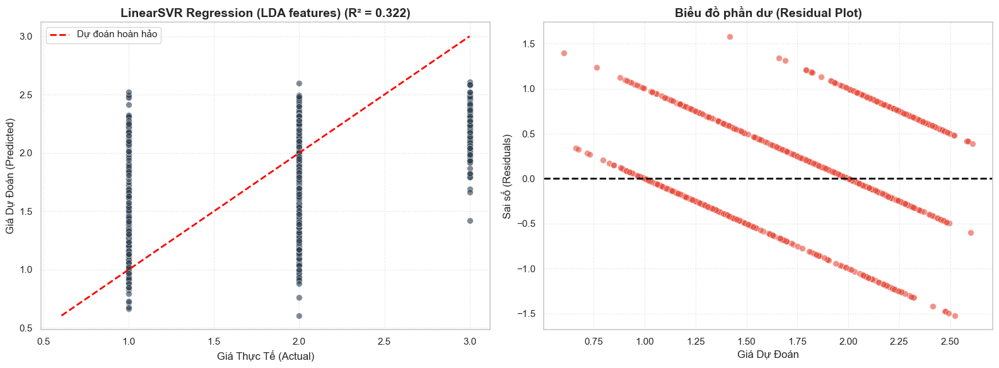

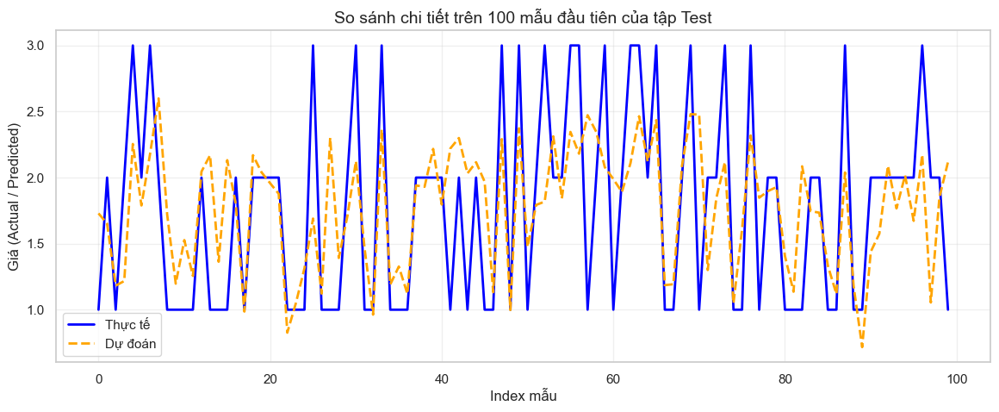

{'y_test': 24653    1
 71877    2
 2883     1
 84435    2
 67901    3
         ..
 3001     3
 53619    2
 16860    2
 76877    2
 62354    2
 Name: Credit_Score, Length: 1000, dtype: int64,
 'y_pred_ori': array([2.00001815, 1.99989553, 0.99999138, 0.99997474, 2.00007067,
        1.99999318, 2.000071  , 2.00025234, 1.9997414 , 0.99995402,
        1.99994417, 1.99969821, 2.00012104, 2.000149  , 1.99978515,
        1.99996275, 1.99988728, 0.99985431, 2.00010765, 2.00016284,
        2.00002963, 1.99998054, 0.99993439, 1.00004418, 1.9996818 ,
        1.9998297 , 1.00012638, 2.00017416, 1.00021765, 1.99992926,
        1.99999511, 1.00023838, 0.99994652, 2.00008322, 1.00013465,
        1.00013263, 1.99956387, 1.99996254, 2.00001878, 1.99991768,
        2.00004304, 1.99994751, 2.00012392, 1.99994446, 1.99995721,
        2.00007503, 0.99994704, 2.00006592, 0.99985306, 2.00012853,
        1.99971668, 1.99999234, 1.99981479, 2.00001785, 2.00031192,
        2.0000937 , 2.0000044 , 1.99997334, 2.0

In [ ]:
train_and_evaluate_svr(X, y_transformed, train_size=0.8, C=1.0)


Original (LinearSVR)
Runtime: 0.1164s
MSE:  0.3986
RMSE: 0.6313
R2:   0.1106

Training on PCA features...

PCA (LinearSVR)
Runtime: 0.1182s
MSE:  0.3270
RMSE: 0.5719
R2:   0.2703

Training on LDA features...

LDA (LinearSVR)
Runtime: 0.0091s
MSE:  0.2993
RMSE: 0.5471
R2:   0.3322

📊 KẾT QUẢ ĐÁNH GIÁ (MODEL TRÊN DỮ LIỆU GỐC)
 1️⃣  R2 Score (Độ phù hợp): 0.3322 (Max là 1.0)
 2️⃣  RMSE (Sai số chuẩn):   $1
 3️⃣  MAE (Sai số tuyệt đối):$0
--------------------------------------------------
❌ Đánh giá: Mô hình KÉM. Cần xem lại các bước xử lý dữ liệu.


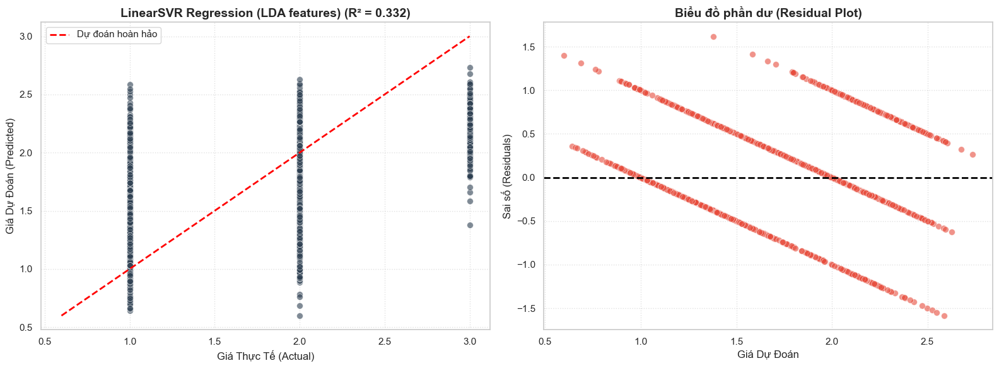

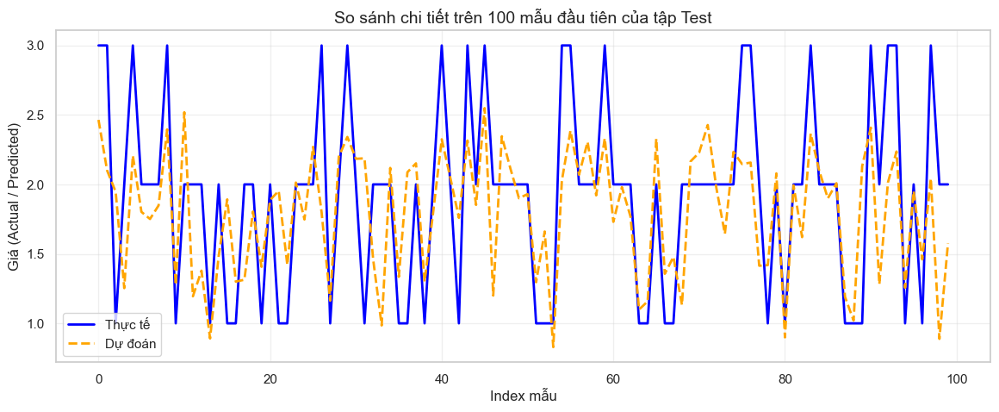

{'y_test': 61533    3
 94822    3
 74174    1
 16778    2
 65214    3
         ..
 62136    1
 23766    1
 29182    1
 46854    2
 27174    3
 Name: Credit_Score, Length: 1500, dtype: int64,
 'y_pred_ori': array([1.99993209, 2.00011627, 2.00006931, ..., 1.00013906, 1.9998729 ,
        2.00005879], shape=(1500,)),
 'y_pred_pca': array([2.36161714, 2.00854017, 2.08207195, ..., 1.32620117, 1.65168231,
        2.14026737], shape=(1500,)),
 'y_pred_lda': array([2.46431708, 2.10035271, 1.94652164, ..., 1.21686742, 1.66661208,
        2.24179311], shape=(1500,)),
 'metrics': {'original': {'mse': 0.39858918359388523,
   'rmse': np.float64(0.6313391985247592),
   'r2': 0.11063080821766136},
  'pca': {'mse': 0.3270498852213096,
   'rmse': np.float64(0.5718827547857249),
   'r2': 0.27025593251385716},
  'lda': {'mse': 0.29928641770082126,
   'rmse': np.float64(0.5470707611459611),
   'r2': 0.3322043588287321}}}

In [ ]:
train_and_evaluate_svr(X, y_transformed, train_size=0.7, C=1.0)


Original (LinearSVR)
Runtime: 0.1035s
MSE:  0.4024
RMSE: 0.6344
R2:   0.1020

Training on PCA features...

PCA (LinearSVR)
Runtime: 0.0917s
MSE:  0.3262
RMSE: 0.5711
R2:   0.2722

Training on LDA features...

LDA (LinearSVR)
Runtime: 0.0077s
MSE:  0.2995
RMSE: 0.5472
R2:   0.3317

📊 KẾT QUẢ ĐÁNH GIÁ (MODEL TRÊN DỮ LIỆU GỐC)
 1️⃣  R2 Score (Độ phù hợp): 0.3317 (Max là 1.0)
 2️⃣  RMSE (Sai số chuẩn):   $1
 3️⃣  MAE (Sai số tuyệt đối):$0
--------------------------------------------------
❌ Đánh giá: Mô hình KÉM. Cần xem lại các bước xử lý dữ liệu.


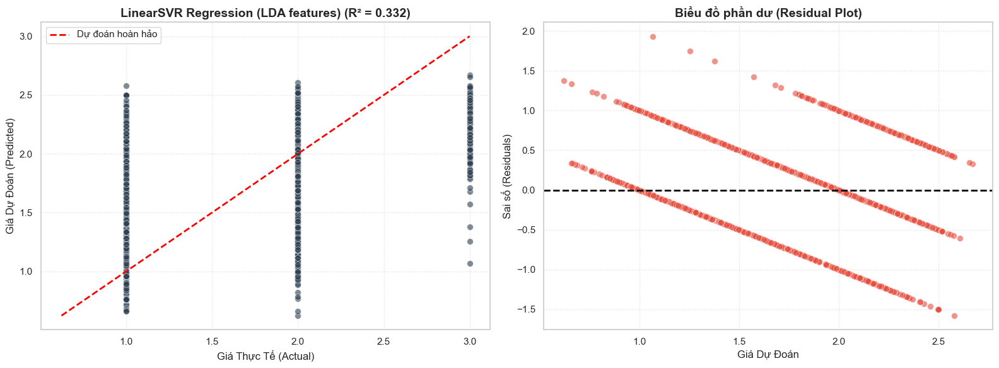

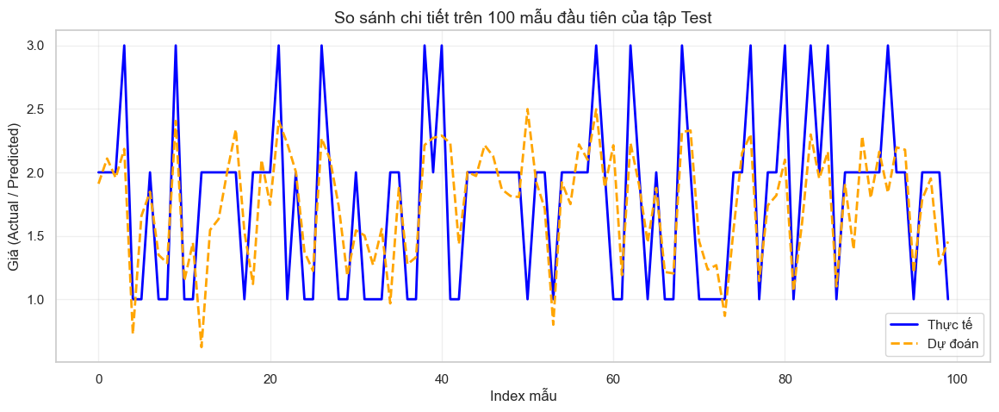

{'y_test': 63711    2
 29842    2
 12975    2
 92080    3
 4037     1
         ..
 85567    2
 54341    3
 12559    1
 12419    2
 57916    2
 Name: Credit_Score, Length: 2000, dtype: int64,
 'y_pred_ori': array([1.99973801, 1.99998881, 1.99973286, ..., 1.99997859, 1.99977835,
        1.99990229], shape=(2000,)),
 'y_pred_pca': array([2.1865747 , 1.97789475, 1.85176336, ..., 1.91599856, 2.05280363,
        1.91429664], shape=(2000,)),
 'y_pred_lda': array([1.91023754, 2.10936278, 1.95709083, ..., 2.17190409, 1.81319031,
        1.80838716], shape=(2000,)),
 'metrics': {'original': {'mse': 0.4024110691955357,
   'rmse': np.float64(0.6343587858582364),
   'r2': 0.10204111731767651},
  'pca': {'mse': 0.32617436911480197,
   'rmse': np.float64(0.5711167736241004),
   'r2': 0.27215925586872847},
  'lda': {'mse': 0.2994816619957064,
   'rmse': np.float64(0.5472491772453444),
   'r2': 0.331722611092396}}}

In [ ]:
train_and_evaluate_svr(X, y_transformed, train_size=0.6, C=1.0)